In [3]:
import pandas as pd
import os
import numpy as np
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import random
from dataclasses import dataclass

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

import gensim # for topic modelling, document indexing and similarity retrieval with large corpora
pkg_resources.require("gensim<=3.8.3");
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE

import scipy.cluster.hierarchy

from IPython.display import display, HTML

from typing import List, Callable, Dict

In [60]:
## Newly added 

from nltk.corpus import wordnet as wn
from nltk import word_tokenize, pos_tag
from collections import defaultdict

### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords',quiet=True)
nltk.download('wordnet',quiet=True)
nltk.download('punkt',quiet=True)
nltk.download('omw-1.4',quiet=True)

True

In [ ]:
#import pkg_resources
#pkg_resources.require("gensim<=3.8.3");

In [5]:
print("Genism Version: ", gensim.__version__)

Genism Version:  4.2.0


In [6]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

### Utility Functions

In [142]:
def add_movie_descriptor(data: pd.DataFrame, corpus_df: pd.DataFrame):
    """
    Adds "Movie Description" to the supplied dataframe, in the form {Genre}_{P|N}_{Movie Title}_{DocID}
    """
    review = np.where(corpus_df['Review Type (pos or neg)'] == 'Positive', 'P', 'N')
    data['Descriptor'] = corpus_df['Genre of Movie'] + '_' + corpus_df['Movie Title'] + '_' + review + '_' + corpus_df['Doc_ID'].astype(str)

def get_corpus_df(data):
    #data = pd.read_csv(path)
    add_movie_descriptor(data, data)
    sorted_data = data.sort_values(['Descriptor'])
    indexed_data = sorted_data.set_index(['Doc_ID'])
    indexed_data['Doc_ID'] = indexed_data.index
    return indexed_data

def remove_punctuation(text):
    return re.sub('[^a-zA-Z]', ' ', str(text))

def lower_case(text):
    return text.lower()    

def remove_tags(text):    
    return re.sub("&lt;/?.*?&gt;"," &lt;&gt; ", text)

def remove_special_chars_and_digits(text):
    return re.sub("(\\d|\\W)+"," ", text)


@dataclass
class Document:
    doc_id: str
    text: str

def normalize_document(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)
    
    return Document(document.doc_id, text)

def normalize_documents(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document(x) for x in documents]

@dataclass
class TokenizedDocument:
    doc_id: str
    tokens: List[str]

def tokenize_document(document: Document) -> TokenizedDocument:
    tokens = nltk.word_tokenize(document.text)
    return TokenizedDocument(document.doc_id, tokens)

def tokenize_documents(documents: List[Document]) -> List[TokenizedDocument]:
    return [tokenize_document(x) for x in documents]

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    for document in documents:
        output_tokens = [lemmatizer.lemmatize(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))
        
    return result

def stem(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    stemmer = PorterStemmer()
    for document in documents:
        output_tokens = [stemmer.stem(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def remove_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    
    stop_words = set(nltk.corpus.stopwords.words('english')) 
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))
        
    return result
    
def add_flags(data: pd.DataFrame, inception_doc_ids: List[int], action_doc_ids: List[int]):
    data['is_inception'] = data.index.isin(inception_doc_ids)
    data['is_action'] = data.index.isin(action_doc_ids)
    
def get_all_tokens(documents: List[TokenizedDocument]) -> List[str]:
    tokens = {y for x in documents for y in x.tokens}
    return sorted(list(tokens))

## newly added

def remove_non_alphabetic_tokens(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    
    al = set('[a-zA-Z]')
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in al]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))
        
    return result

In [150]:
## New 

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    ## newly added
    tag_map = defaultdict(lambda: wn.NOUN)
    tag_map['J'] = wn.ADJ
    tag_map['V'] = wn.VERB
    tag_map['R'] = wn.ADV
    for document in documents:
        for token, tag in pos_tag(document.tokens):
            output_tokens = lemmatizer.lemmatize(token, tag_map[tag[0]]) ## two inputs here
        
        result.append(TokenizedDocument(document.doc_id, output_tokens))
        
    return result

In [33]:
data = pd.read_csv('https://raw.githubusercontent.com/djp840/MSDS_453_Public/main/MSDS453_ClassCorpus/ClassCorpus_Final_v2_20220629.csv')
corpus_df = get_corpus_df(data)
documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

In [184]:
data.head()

,Doc_ID,DSI_Title,Text,Submission File Name,Student Name,Genre of Movie,Review Type (pos or neg),Movie Title,Descriptor
0,160,ARE_Doc1_Taxi,Jimmy Fallon's big screen career may be over b...,ARE_Doc1_Taxi,ARE,Action,Negative,Taxi,Action_Taxi_N_160
1,161,ARE_Doc2_Taxi,"After getting nominated for ""Chicago"" and maki...",ARE_Doc2_Taxi,ARE,Action,Positive,Taxi,Action_Taxi_P_161
2,162,ARE_Doc3_Taxi,Queen Latifah handily walked away with the sho...,ARE_Doc3_Taxi,ARE,Action,Negative,Taxi,Action_Taxi_N_162
3,163,ARE_Doc4_Taxi,So Jimmy Fallon leaves ÒSaturday Night LiveÓ a...,ARE_Doc4_Taxi,ARE,Action,Negative,Taxi,Action_Taxi_N_163
4,164,ARE_Doc5_Taxi,TaxiÊcasts JimmyÊFallon as Officer Andy Washbu...,ARE_Doc5_Taxi,ARE,Action,Negative,Taxi,Action_Taxi_N_164


In [64]:
candidate_terms = [
    'film',
    'nolan',
    'movie',
    'since',
    'come',
    'deliver',
    'watch',
    'nearly',
    'leo',
    'hollywood',
    'action',
    'dream',
    'art',
    'fiction',
    'budget'
]

### Exploritory Data Analysis

In [34]:
corpus_df.head()

,DSI_Title,Text,Submission File Name,Student Name,Genre of Movie,Review Type (pos or neg),Movie Title,Descriptor,Doc_ID
Doc_ID,,,,,,,,,
40,KCM_Doc1_AngelHasFallen,Boredom sets in long before the start of Angel...,KCM_Doc1_AngelHasFallen,KCM,Action,Negative,Angel Has Fallen,Action_Angel Has Fallen_N_40,40
41,KCM_Doc2_AngelHasFallen,\nWho ARE all these people?\n\nThat was what...,KCM_Doc2_AngelHasFallen,KCM,Action,Negative,Angel Has Fallen,Action_Angel Has Fallen_N_41,41
42,KCM_Doc3_AngelHasFallen,Ric Roman Waughs Angel Has Fallen sees U.S. S...,KCM_Doc3_AngelHasFallen,KCM,Action,Negative,Angel Has Fallen,Action_Angel Has Fallen_N_42,42
43,KCM_Doc4_AngelHasFallen,There is a certain mindless pleasure in the Fa...,KCM_Doc4_AngelHasFallen,KCM,Action,Negative,Angel Has Fallen,Action_Angel Has Fallen_N_43,43
44,KCM_Doc5_AngelHasFallen,"No, you dont need to have seen Olympus Has F...",KCM_Doc5_AngelHasFallen,KCM,Action,Negative,Angel Has Fallen,Action_Angel Has Fallen_N_44,44


In [35]:
corpus_df.shape

(200, 9)

In [36]:
print(corpus_df.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 40 to 199
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   DSI_Title                 200 non-null    object
 1   Text                      200 non-null    object
 2   Submission File Name      200 non-null    object
 3   Student Name              200 non-null    object
 4   Genre of Movie            200 non-null    object
 5   Review Type (pos or neg)  200 non-null    object
 6   Movie Title               200 non-null    object
 7   Descriptor                200 non-null    object
 8   Doc_ID                    200 non-null    int64 
dtypes: int64(1), object(8)
memory usage: 15.6+ KB
None


In [37]:
print(corpus_df['Movie Title'].unique())

['Angel Has Fallen' 'Inception' 'No Time To Die' 'Taken' 'Taxi'
 'Despicable Me 3' 'Dirty Grandpa' 'Holmes and Watson' 'Legally Blonde'
 'The Lost City' 'Drag me to hell' 'Fresh' 'It Chapter Two'
 'The Toxic Avenger' 'US' 'Batman' 'Equilibrium' 'Minority Report'
 'Oblivion' 'Pitch Black']


In [39]:
print('Number of Reviews by Movie Genre')
counts_df = corpus_df[['Genre of Movie']].copy()
counts_df['Count'] = 1
counts_df.groupby(['Genre of Movie']).count().reset_index()

Number of Reviews by Movie Genre


,Genre of Movie,Count
0,Action,50
1,Comedy,50
2,Horror,50
3,Sci-Fi,50


### Data Processing

### (i). Data Wrangling

### (1) baseline = tokenization + normalization

### Normalize Document

1. remove_punctuation(text)

2. lower_case(text)

3. remove_tags(text)

4. remove_special_chars_and_digits(text)

5. return Document(document.doc_id, text)

In [44]:
normalized_documents = normalize_documents(documents)
normalized_documents[0]

Document(doc_id=40, text='boredom sets in long before the start of angel has fallen i start my journey to the movie by changing out of my work clothes into something more comfortable instead of something complex like a dress shirt with buttons and a collar along with khaki pants that require a belt i wear a loose fitting t shirt and a light pair of cargo shorts i want something simple and uncomplicated like the plot to an action movie boiled down to guy is framed guy wants revenge guy kills guys for revenge it took only one person to pick out both of my outfits for the day an accomplishment that seems remarkable compared to the three people who wrote the script to angel has fallen completely different from the two people who wrote the story of said movie a total of five people were needed to tell another convoluted story of gerard butler running from slightly bearded men with guns for two hours compared to the minutes it took me to figure out the clothes appropriate for the day it s ha

### Functions for Tokenization Process

1. tokenize_document
2. tokenize_documents

In [168]:
tokenized_documents = tokenize_documents(normalized_documents)
tokenized_documents[0]

TokenizedDocument(doc_id=40, tokens=['boredom', 'sets', 'in', 'long', 'before', 'the', 'start', 'of', 'angel', 'has', 'fallen', 'i', 'start', 'my', 'journey', 'to', 'the', 'movie', 'by', 'changing', 'out', 'of', 'my', 'work', 'clothes', 'into', 'something', 'more', 'comfortable', 'instead', 'of', 'something', 'complex', 'like', 'a', 'dress', 'shirt', 'with', 'buttons', 'and', 'a', 'collar', 'along', 'with', 'khaki', 'pants', 'that', 'require', 'a', 'belt', 'i', 'wear', 'a', 'loose', 'fitting', 't', 'shirt', 'and', 'a', 'light', 'pair', 'of', 'cargo', 'shorts', 'i', 'want', 'something', 'simple', 'and', 'uncomplicated', 'like', 'the', 'plot', 'to', 'an', 'action', 'movie', 'boiled', 'down', 'to', 'guy', 'is', 'framed', 'guy', 'wants', 'revenge', 'guy', 'kills', 'guys', 'for', 'revenge', 'it', 'took', 'only', 'one', 'person', 'to', 'pick', 'out', 'both', 'of', 'my', 'outfits', 'for', 'the', 'day', 'an', 'accomplishment', 'that', 'seems', 'remarkable', 'compared', 'to', 'the', 'three', 'p

In [217]:
def clean_method_1(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, and tokenizes.
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
        
    return documents

In [219]:
## check if two ways of doing it generate the same result

clean_method_1(documents)[0] == tokenized_documents[0]

True

In [220]:
## save the result

documents_1 = clean_method_1(documents)[0]

### (2). baseline + lemmatization + stop words

In [209]:
def clean_method_2(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, tokenizes, lemmatizes, and removes stop words.
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
    documents = lemmatize(documents)
    documents = remove_stop_words(documents)
        
    return documents

In [154]:
## another way to do it

lemmatized_documents = lemmatize(tokenized_documents)
removed_stop_documents = remove_stop_words(lemmatized_documents)
removed_stop_documents[0]

TokenizedDocument(doc_id=40, tokens=['boredom', 'set', 'long', 'start', 'angel', 'ha', 'fallen', 'start', 'journey', 'movie', 'changing', 'work', 'clothes', 'something', 'comfortable', 'instead', 'something', 'complex', 'like', 'dress', 'shirt', 'button', 'collar', 'along', 'khaki', 'pant', 'require', 'belt', 'wear', 'loose', 'fitting', 'shirt', 'light', 'pair', 'cargo', 'short', 'want', 'something', 'simple', 'uncomplicated', 'like', 'plot', 'action', 'movie', 'boiled', 'guy', 'framed', 'guy', 'want', 'revenge', 'guy', 'kill', 'guy', 'revenge', 'took', 'one', 'person', 'pick', 'outfit', 'day', 'accomplishment', 'seems', 'remarkable', 'compared', 'three', 'people', 'wrote', 'script', 'angel', 'ha', 'fallen', 'completely', 'different', 'two', 'people', 'wrote', 'story', 'said', 'movie', 'total', 'five', 'people', 'needed', 'tell', 'another', 'convoluted', 'story', 'gerard', 'butler', 'running', 'slightly', 'bearded', 'men', 'gun', 'two', 'hour', 'compared', 'minute', 'took', 'figure', '

In [213]:
## check if these two ways generate the same output

clean_method_2(documents)[0] == removed_stop_documents[0]

True

In [214]:
## save the result

documents_2 = clean_method_2(documents)

### (3). baseline + lemmatization + stop words + remove non alphabetic tokens

In [215]:
def clean_method_3(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, tokenizes, lemmatizes, removes stop words, and remove non alphabetic tokens
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
    documents = lemmatize(documents)
    documents = remove_stop_words(documents)
    documents = remove_non_alphabetic_tokens(documents)
        
    return documents

In [216]:
## another way of doing it 

removed_nonal_documents = remove_non_alphabetic_tokens(removed_stop_documents)

## check if the two ways generate the same result

clean_method_3(documents)[0] == removed_nonal_documents[0]

True

In [146]:
## save the result

documents_3 = removed_nonal_documents

### Useful Lookups (Titles by DocID, Genres by DocID, Description by DocID)

In [47]:
titles_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Movie Title'])}
genres_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Genre of Movie'])}
descriptors_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Descriptor'])}

action_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] == 'Action']
action_documents = [x for x in documents if x.doc_id in action_doc_ids]

non_action_doc_ids = {int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] != 'Action'}
non_action_documents = [x for x in documents if x.doc_id in non_action_doc_ids]

In [49]:
inception_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if titles_by_doc_ids[x] == 'Inception']
inception_documents = [x for x in documents if x.doc_id in inception_doc_ids]

In [63]:
inception_doc_ids # the Doc_ID of my documents

[85, 86, 87, 88, 89, 80, 81, 82, 83, 84]

### CountVectorizer

In [68]:
vectorizer = CountVectorizer(ngram_range=(1, 1))
text_for_counts = [x.text for x in normalized_documents]
matrix = vectorizer.fit_transform(text_for_counts)
words = vectorizer.get_feature_names_out()
word_counts = pd.DataFrame(matrix.toarray(), columns=words, index=corpus_df.Doc_ID)

In [69]:
add_flags(word_counts, inception_doc_ids, action_doc_ids)
word_counts['Doc_ID'] = word_counts.index

In [70]:
word_counts

,aaron,abandon,abandoned,abandoning,abandonment,abducted,abduction,abductor,abductors,abducts,...,zombie,zombies,zone,zones,zonk,zooms,zora,is_inception,is_action,Doc_ID
Doc_ID,,,,,,,,,,,,,,,,,,,,,
40,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,True,40
41,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,True,41
42,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,True,42
43,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,True,43
44,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,True,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,False,190
193,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,False,193
194,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,False,False,194


In [71]:
# Collect result into a dataframe
mean_frequencies = pd.DataFrame(index=candidate_terms)

inception_mean_frequencies = word_counts[word_counts.is_inception][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['Inception'] = inception_mean_frequencies

action_mean_frequencies = word_counts[word_counts.is_action][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Action'] = action_mean_frequencies

non_action_mean_frequencies = word_counts[~word_counts.is_action][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Non-Action'] = non_action_mean_frequencies

In [73]:
mean_frequencies.fillna(0.0).sort_values(['Inception'], ascending=False)

,Inception,All Action,All Non-Action
movie,8.9,4.10,2.780000
film,5.4,4.28,4.246667
dream,5.2,1.08,0.040000
nolan,4.7,0.94,0.066667
action,1.4,2.40,0.840000
leo,1.3,0.26,0.073333
come,1.1,0.86,0.500000
hollywood,0.7,0.34,0.126667
since,0.6,0.48,0.286667
watch,0.5,0.28,0.353333


In [74]:
## Based on the result above, these words showed up with high frequencies

important_prevalent_terms = [
    'movie',
    'film',
    'dream',
    'nolan',
    'action',
    'leo',
    'come',
    'hollywood'
]
stemmer = PorterStemmer()
stemmed_important_prevalent_terms = [stemmer.stem(x) for x in important_prevalent_terms]

In [75]:
pd.options.display.float_format = '{:,.2f}'.format
mean_frequencies.fillna(0.0).loc[important_prevalent_terms].round(2).sort_values(['Inception'], ascending=False)

,Inception,All Action,All Non-Action
movie,8.90,4.10,2.78
film,5.40,4.28,4.25
dream,5.20,1.08,0.04
nolan,4.70,0.94,0.07
action,1.40,2.40,0.84
leo,1.30,0.26,0.07
come,1.10,0.86,0.50
hollywood,0.70,0.34,0.13


### (ii). Document vectorization using TF-IDF

### TF-IDF Experiment Functions - Text Normalization

In [245]:
def run_tfidf(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True):
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]
    
    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
                                        .sort_values(by='score', ascending=False)\
                                        .reset_index(drop=True)

            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')
    
    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # Create document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix, 
                               columns=vectorizer.get_feature_names_out(), 
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, inception_doc_ids, action_doc_ids)
    
    # Print the top 10 mean TF-IDF values
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)
    
    # Collect result into a dataframe
    tfidf_results = pd.DataFrame(index=important_prevalent_terms)
 
    all_tfidf_results = doc_term_df[[x for x in important_prevalent_terms if x in doc_term_df.columns]].mean().round(2)
    tfidf_results['All Movies'] = all_tfidf_results
    
    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    
    print(f'Vocabulary size: {doc_term_df.shape[1]}')
    
    descriptors = corpus_df['Descriptor']
       
    similarities = cosine_similarity(doc_term_df.loc[action_doc_ids], doc_term_df.loc[action_doc_ids])
    fig, ax = plt.subplots(figsize=(30, 30))
    labels = [descriptors_by_doc_ids[x.doc_id] for x in action_documents]
    sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
    #plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
    plt.show()

### TF-IDF: Experiments, Normalize, Tokenize, Lemmatization and Stop Word Removal

### Using Data Wrangling Method 1

,Mean TF-IDF
the,43.96
and,22.15
of,21.43
to,20.12
in,13.54
is,12.89
it,10.65
that,10.54
as,7.33
with,7.17


Vocabulary size: 14891


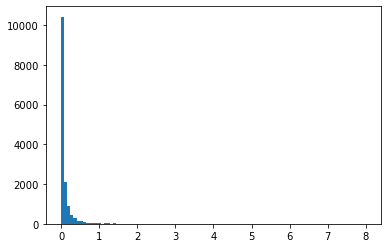

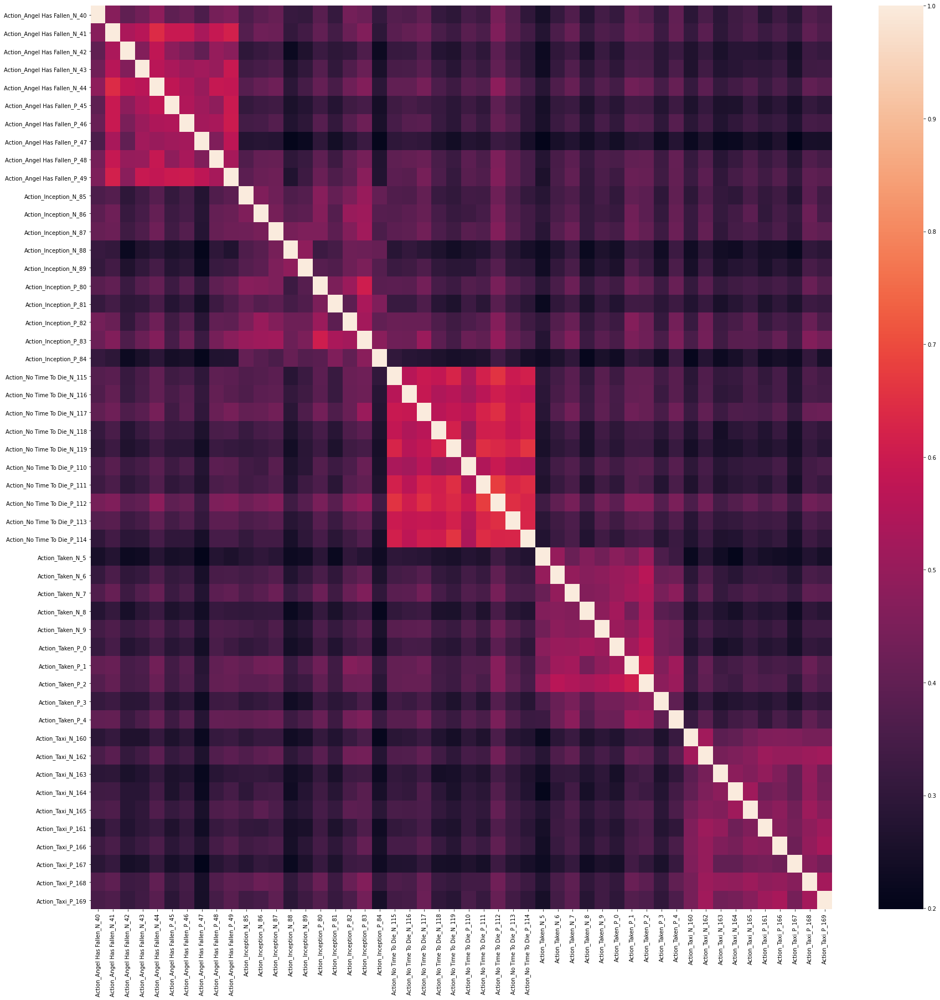

In [259]:
## Method 1: baseline =  normalization + tokenization
## The input variable of TF-IDF is documents, and the run_tfidf function will clean the data according to the right the method

run_tfidf(documents, clean_method_1, important_prevalent_terms, 'TFIDF_exp')

### Using Data Wrangling Method 2

,Mean TF-IDF
film,5.75
movie,4.60
ha,3.51
wa,3.36
one,3.31
bond,3.14
like,2.87
time,2.60
get,2.29
character,2.25


Vocabulary size: 13220


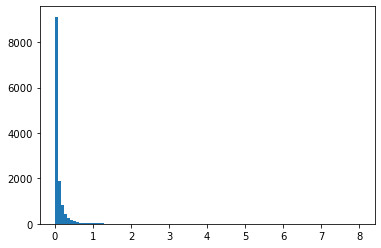

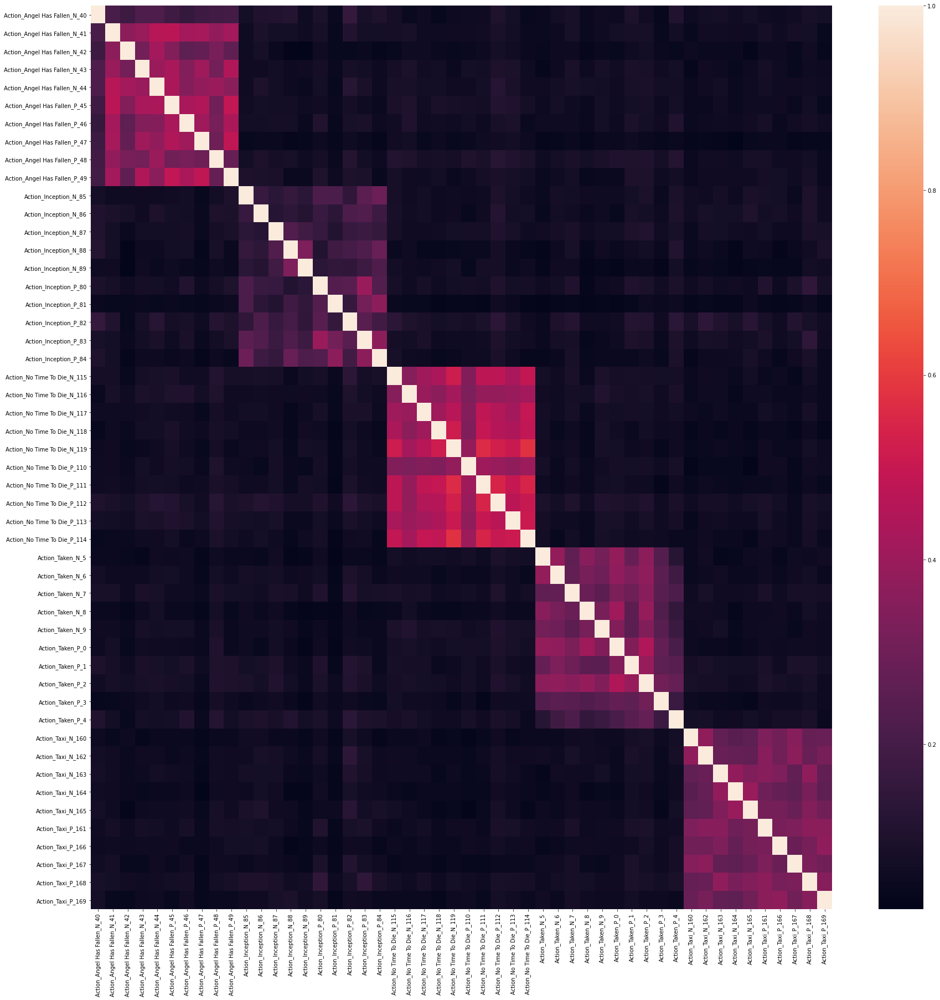

In [223]:
## Method 2: baseline + lemmatization + stop words

run_tfidf(documents, clean_method_2, important_prevalent_terms, 'TFIDF_exp_2')

### Using Data Wrangling Method 3

,Mean TF-IDF
film,5.75
movie,4.60
ha,3.51
wa,3.36
one,3.31
bond,3.14
like,2.87
time,2.60
get,2.29
character,2.25


Vocabulary size: 13220


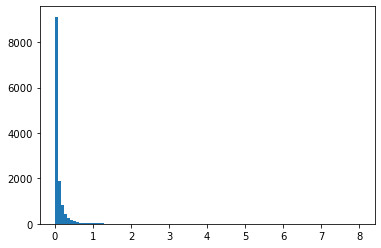

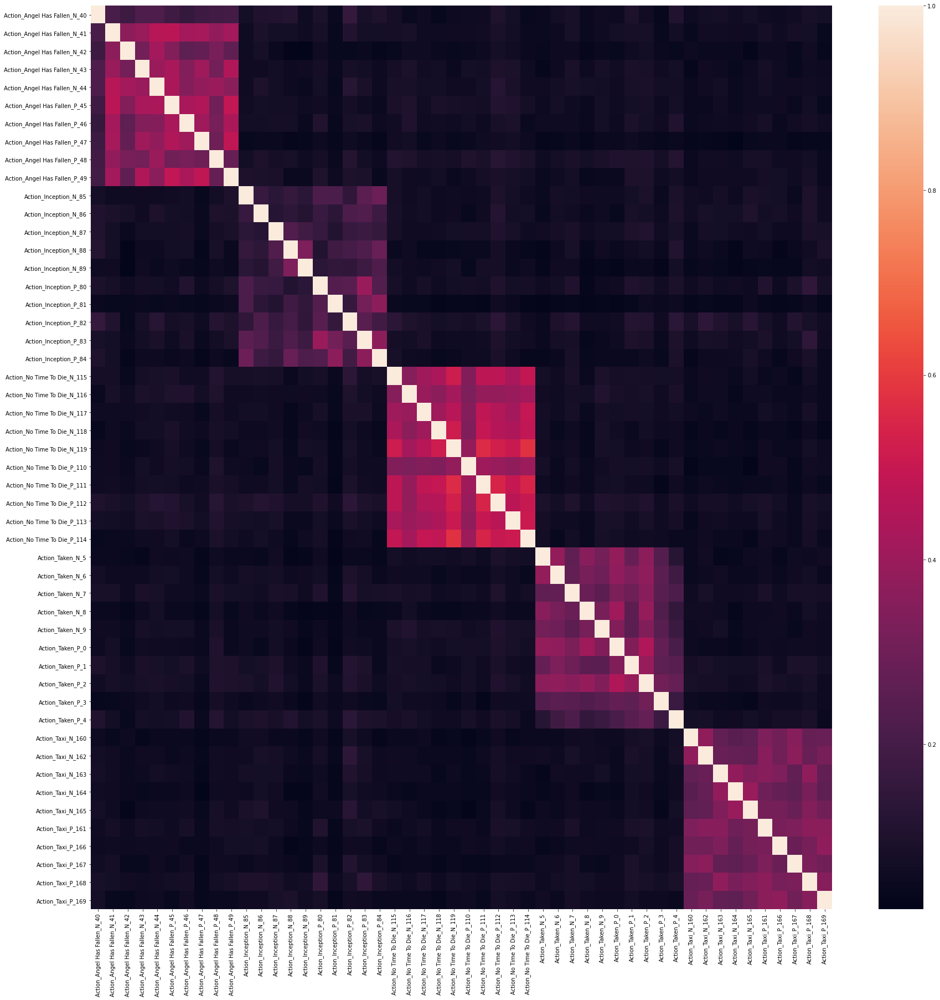

In [224]:
## Method 3: baseline + lemmatization + stop words + remove non alphabetic tokens

run_tfidf(documents, clean_method_3, important_prevalent_terms, 'TFIDF_exp_3')

### (iii). Document vectorization using Doc2Vec

In [99]:
def plot_similarity_matrix(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=similarities, xticklabels=data.index, yticklabels=data.index);
    #plt.savefig(f'figures/{experiment_name}_heatmap.png')
    plt.close()
    
def plot_similarity_clustermap(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    cm = sns.clustermap(similarities, metric='cosine', xticklabels=data.index, yticklabels=data.index, method='complete', cmap='RdBu', figsize=figsize)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    plt.legend(loc='upper left')
    #plt.savefig(f'figures/{experiment_name}_clustermap.png')
    plt.show()
    plt.close()

def plot_tsne(data: pd.DataFrame, perplexity: int, experiment_name: str, figsize=(40, 40)):
    """
    Creates a TSNE plot of the supplied dataframe
    """
    tsne_model = TSNE(perplexity=perplexity, n_components=2, learning_rate='auto', init='pca', n_iter=1000, random_state=32)
    new_values = tsne_model.fit_transform(data)
    
    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=figsize)
    labels = list(data.index)
    for i in range(len(x)):
        new_value = new_values[i]
        x = new_value[0]
        y = new_value[1]
        
        plt.scatter(x, y)
        plt.annotate(labels[i],
                     xy=(x, y),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    #plt.savefig(f'figures/{experiment_name}_tsne.png')
    plt.show()
    plt.close()

In [97]:
def run_doc2vec(documents: List[TokenizedDocument], embedding_size: int, descriptors_by_doc_ids: Dict[int, str]):
    tagged_documents = [TaggedDocument(document.tokens, [i]) for i, document in enumerate(documents)]
    doc2vec_model = Doc2Vec(tagged_documents, vector_size=embedding_size, window=3, min_count=2, workers=12)    
    
    doc2vec_df = pd.DataFrame()
    for document in documents:
        vector = pd.DataFrame(doc2vec_model.infer_vector(document.tokens)).transpose()
        doc2vec_df = pd.concat([doc2vec_df, vector], axis=0)
    
    doc2vec_df['Descriptor'] = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    doc2vec_df.set_index(['Descriptor'], inplace=True)
    return doc2vec_df

def run_doc2vec_experiment(documents: List[Document],
                           clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                           embedding_size: int,
                           experiment_name: str):
    cleaned_documents = clean_func(documents)
    doc2vec_df = run_doc2vec(cleaned_documents, embedding_size, descriptors_by_doc_ids)
    
    plot_similarity_matrix(doc2vec_df, experiment_name)
    plot_similarity_clustermap(doc2vec_df, experiment_name, figsize=(50, 50))
    plot_tsne(doc2vec_df, 30, experiment_name)

In [278]:
def gettoken_tfidf_top100(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True):
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]
    
    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
                                        .sort_values(by='score', ascending=False)\
                                        .reset_index(drop=True)

            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')
    
    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # Create document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix, 
                               columns=vectorizer.get_feature_names_out(), 
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, inception_doc_ids, action_doc_ids)
    
    # Print the top 100 mean TF-IDF values
    top100_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(100))
    #top100_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    #display(top100_tfidf)
    
    return top100_tfidf.index

In [279]:
# Find the tokens with the top 100 mean TF-IDF values

gettoken_tfidf_top100(documents, clean_method_3, important_prevalent_terms, 'TFIDF_top100')


Index(['film', 'movie', 'ha', 'wa', 'one', 'bond', 'like', 'time', 'get',
       'character', 'make', 'action', 'scene', 'elle', 'even', 'would',
       'batman', 'much', 'way', 'holmes', 'also', 'thing', 'year', 'first',
       'story', 'two', 'see', 'well', 'good', 'doe', 'come', 'equilibrium',
       'city', 'take', 'peele', 'anderton', 'world', 'toxic', 'spielberg',
       'new', 'people', 'go', 'horror', 'jack', 'look', 'never', 'report',
       'noa', 'loretta', 'banning', 'lost', 'gru', 'preston', 'best', 'work',
       'watson', 'minority', 'feel', 'bryan', 'find', 'know', 'set', 'comedy',
       'life', 'cruise', 'little', 'something', 'john', 'craig', 'mike',
       'could', 'many', 'man', 'though', 'plot', 'back', 'fallen', 'say',
       'die', 'sequence', 'may', 'great', 'really', 'dream', 'think', 'family',
       'still', 'director', 'future', 'sense', 'gun', 'want', 'enough',
       'actor', 'old', 'point', 'going', 'long', 'taken', 'performance'],
      dtype='object')

### Using Data Wrangling Method 1

No handles with labels found to put in legend.


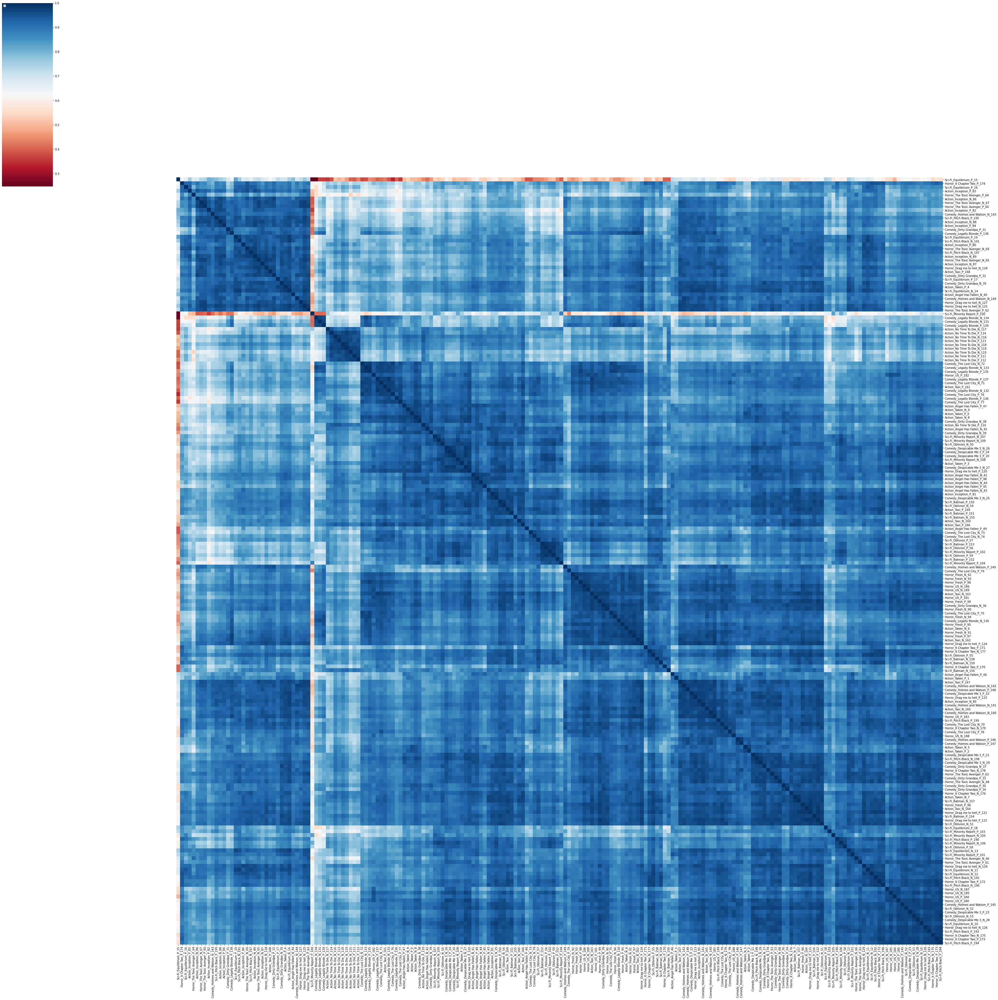

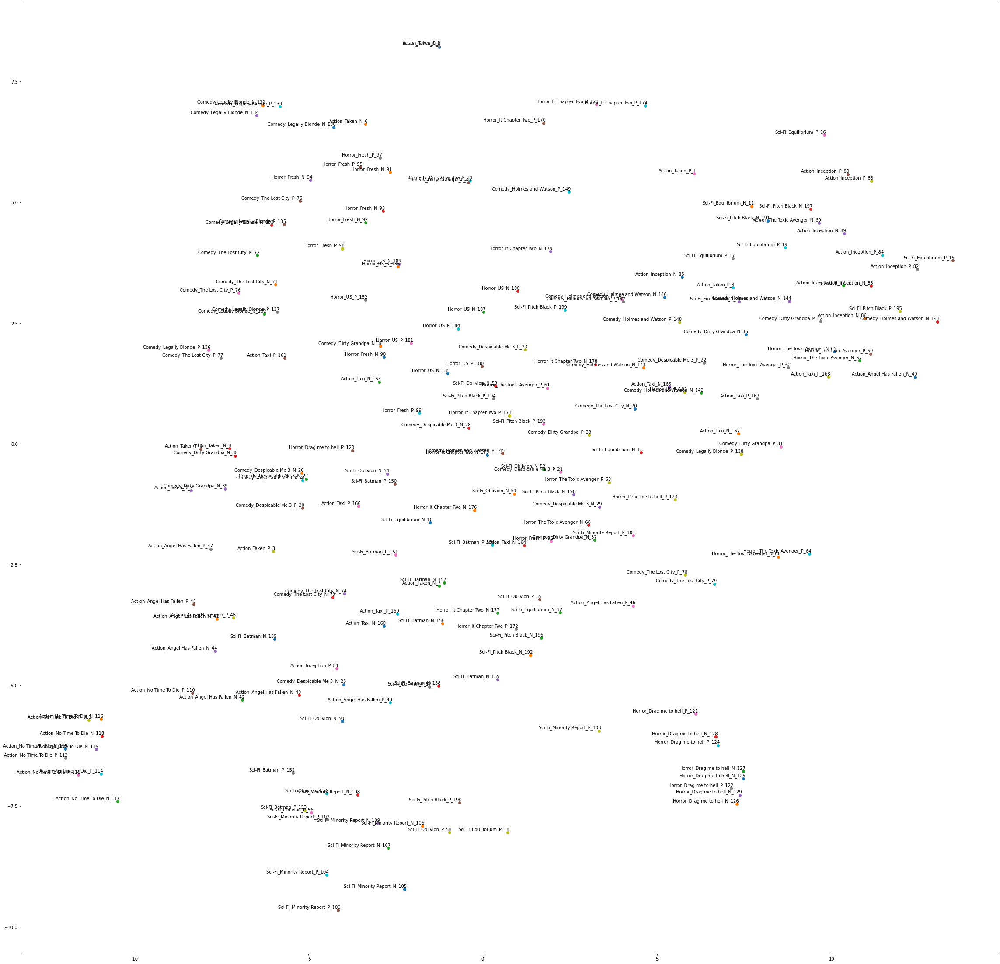

In [225]:
run_doc2vec_experiment(documents, clean_method_1, 100, 'Doc2Vec_exp')

No handles with labels found to put in legend.


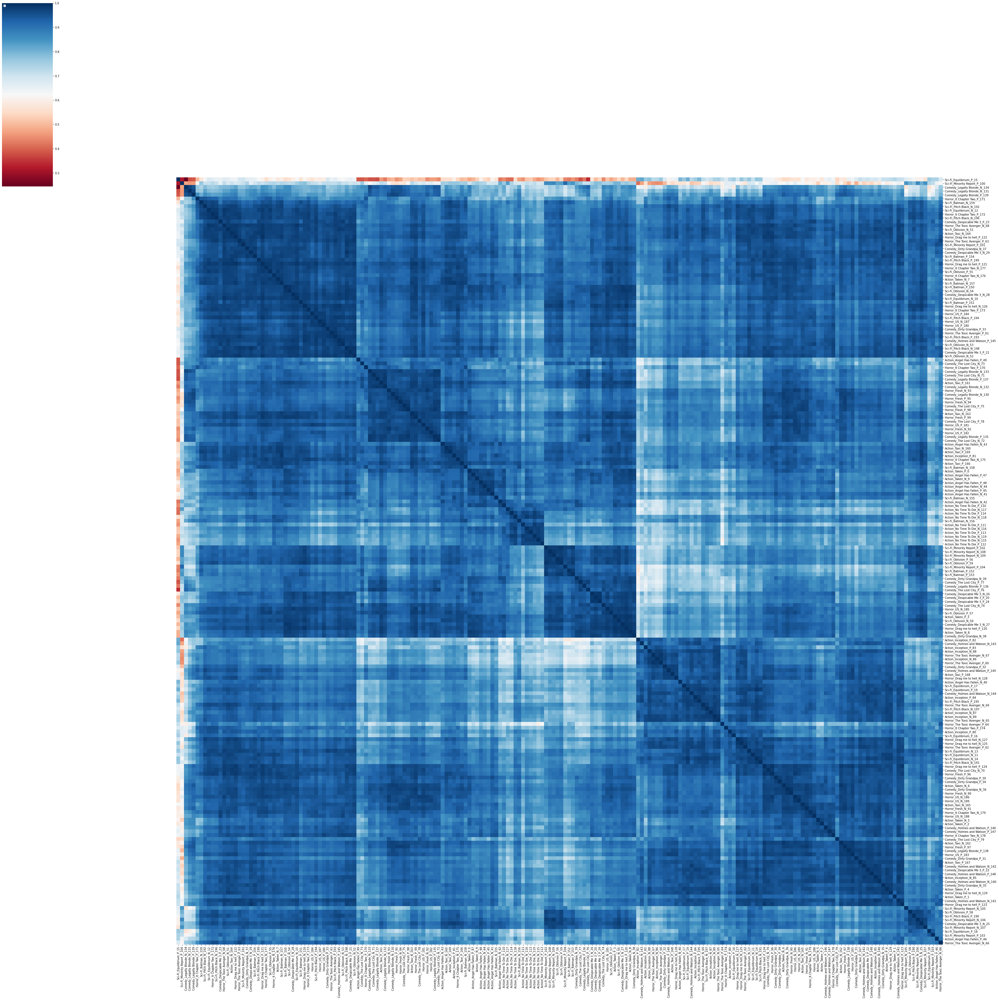

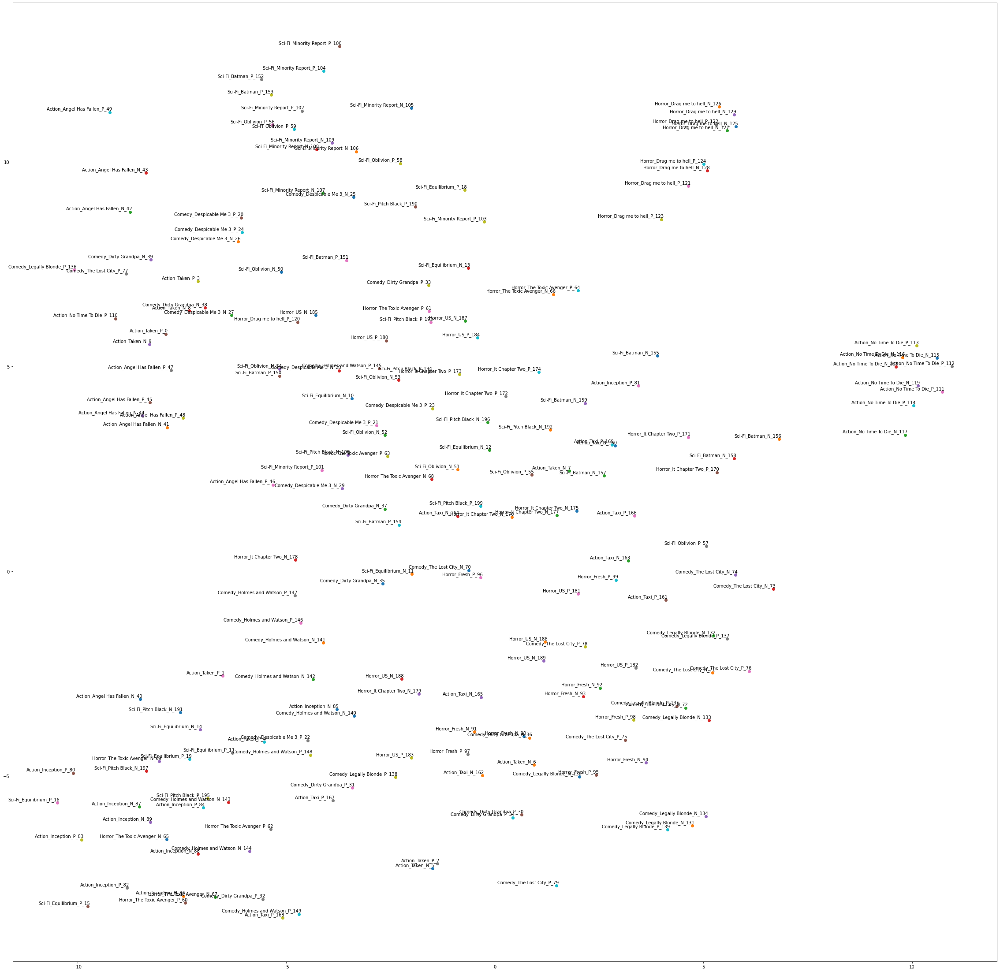

In [228]:
run_doc2vec_experiment(documents, clean_method_1, 200, 'Doc2Vec_exp')

No handles with labels found to put in legend.


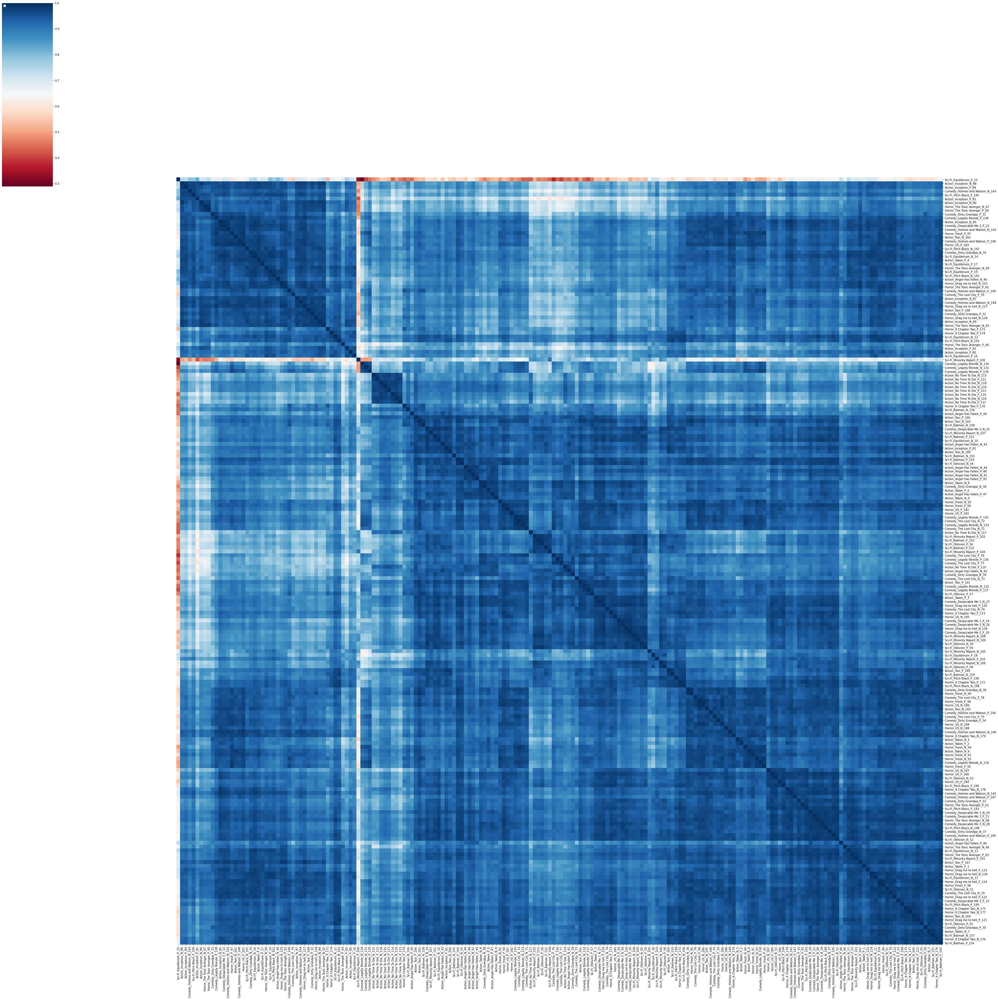

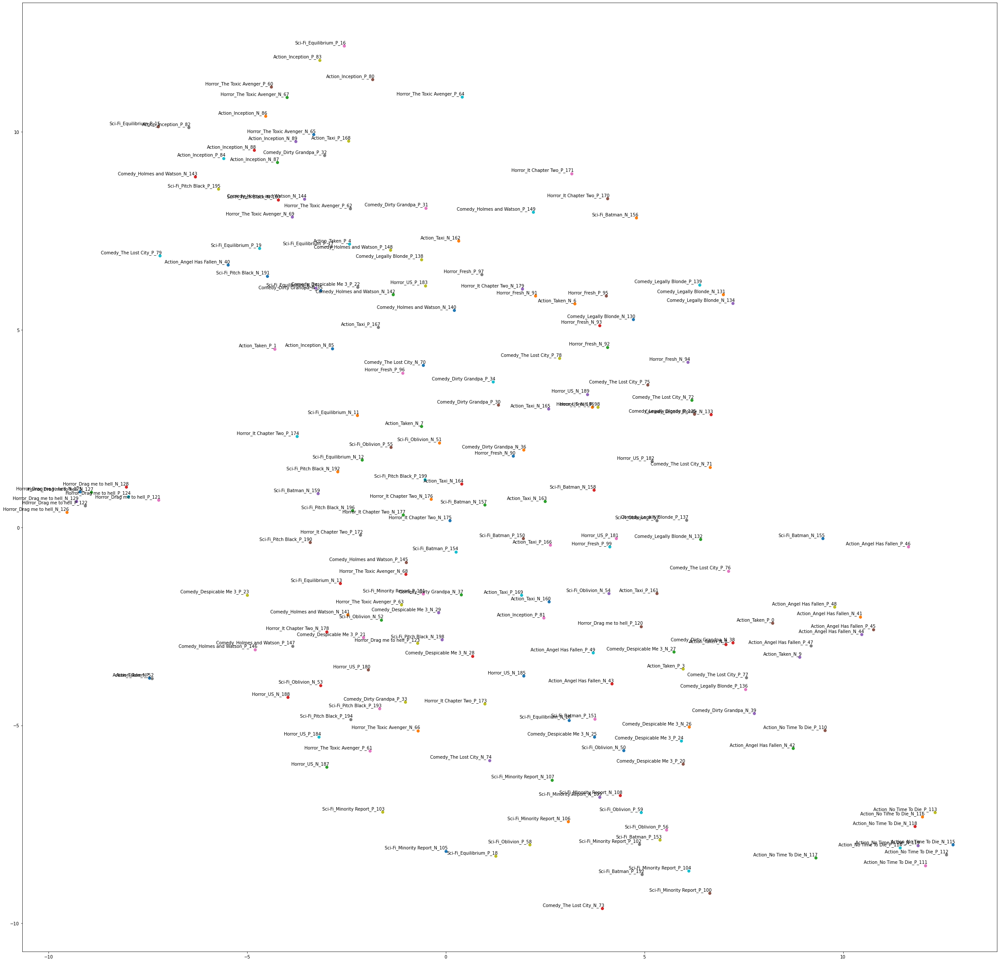

In [229]:
run_doc2vec_experiment(documents, clean_method_1, 300, 'Doc2Vec_exp')

### Using Data Wrangling Method 2

No handles with labels found to put in legend.


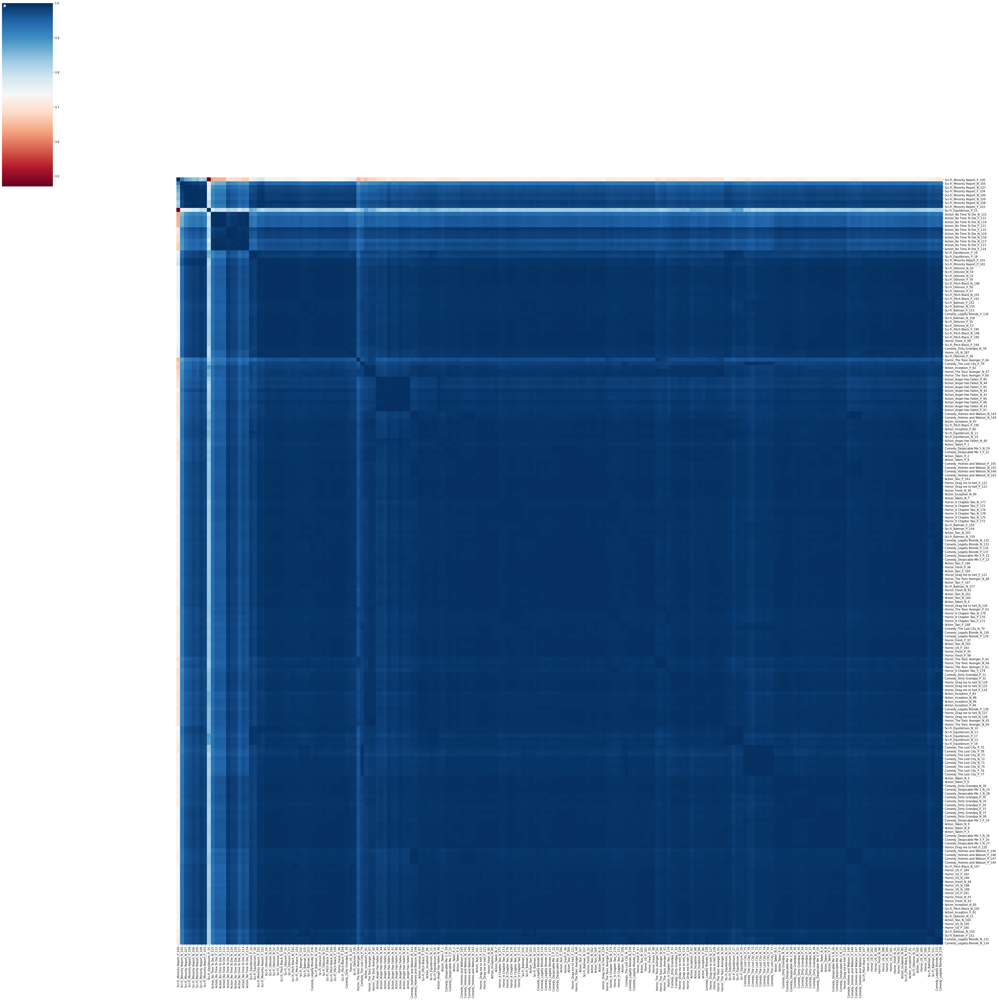

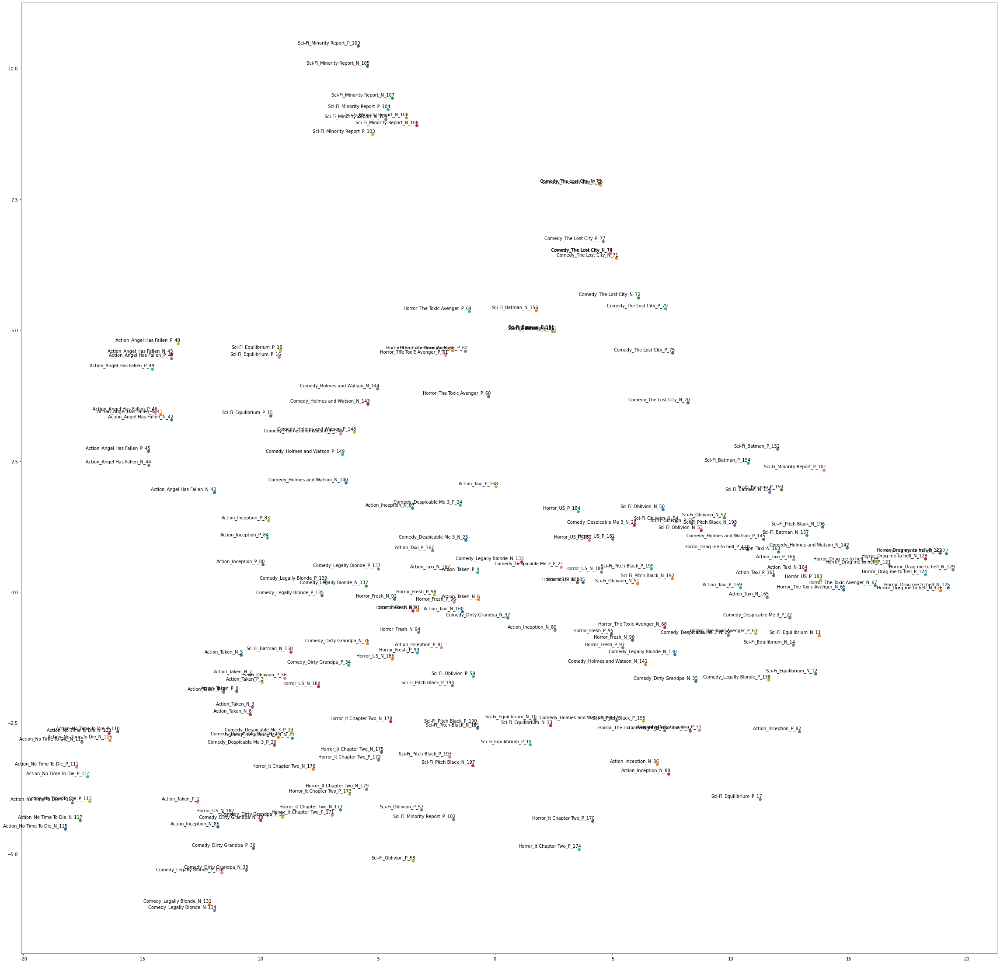

In [230]:
run_doc2vec_experiment(documents, clean_method_2, 100, 'Doc2Vec_exp')

No handles with labels found to put in legend.


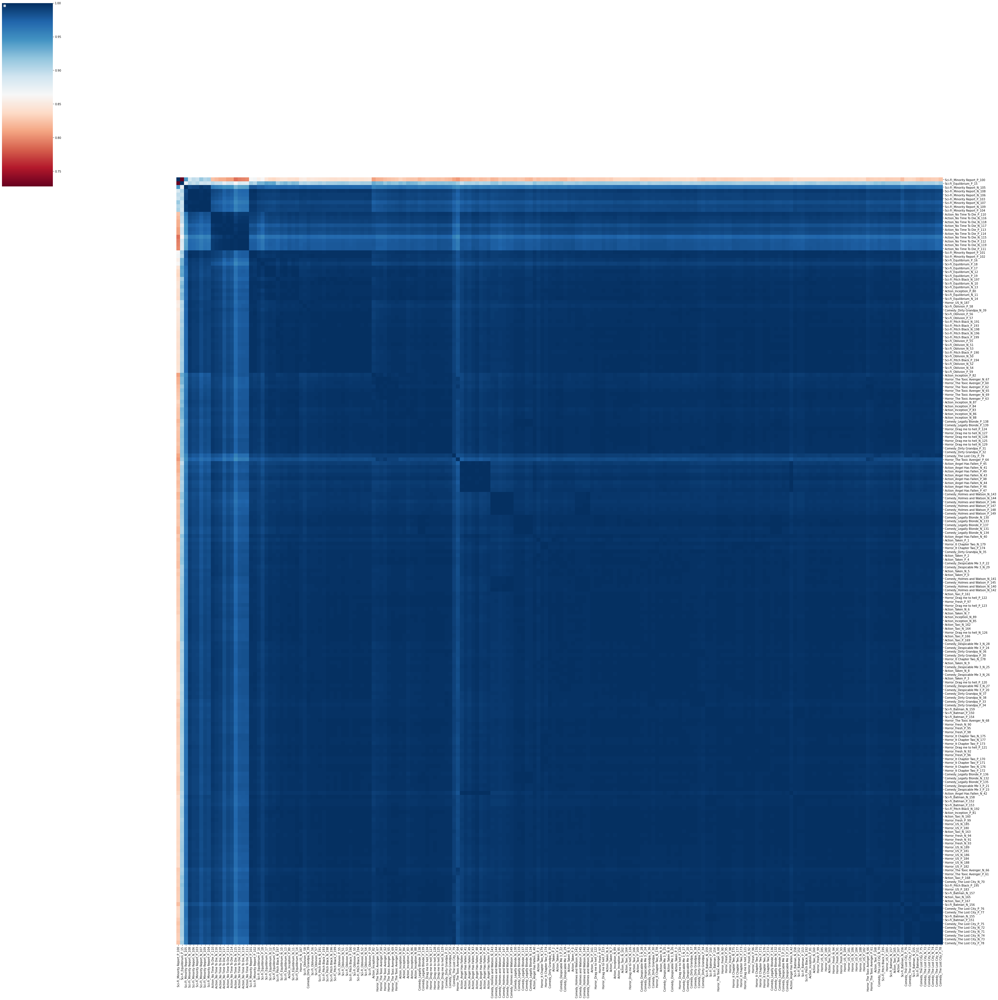

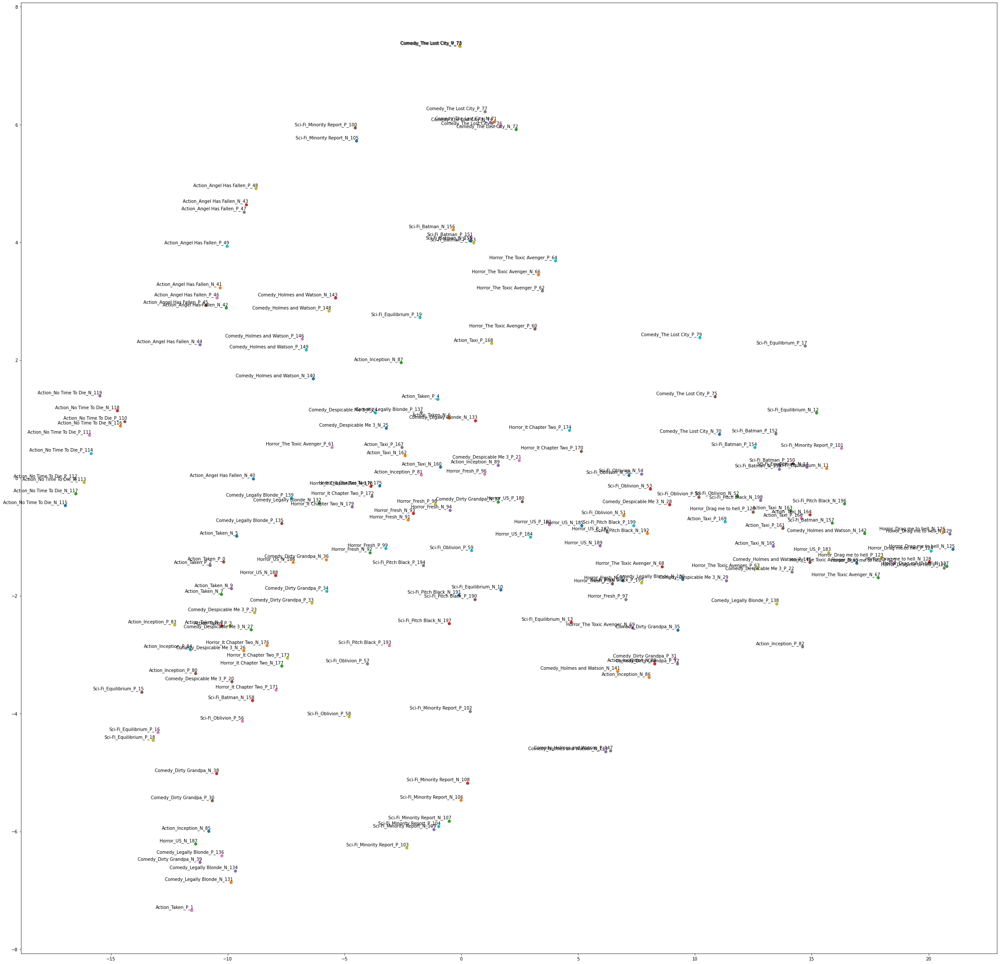

In [226]:
run_doc2vec_experiment(documents, clean_method_2, 200, 'Doc2Vec_exp')

No handles with labels found to put in legend.


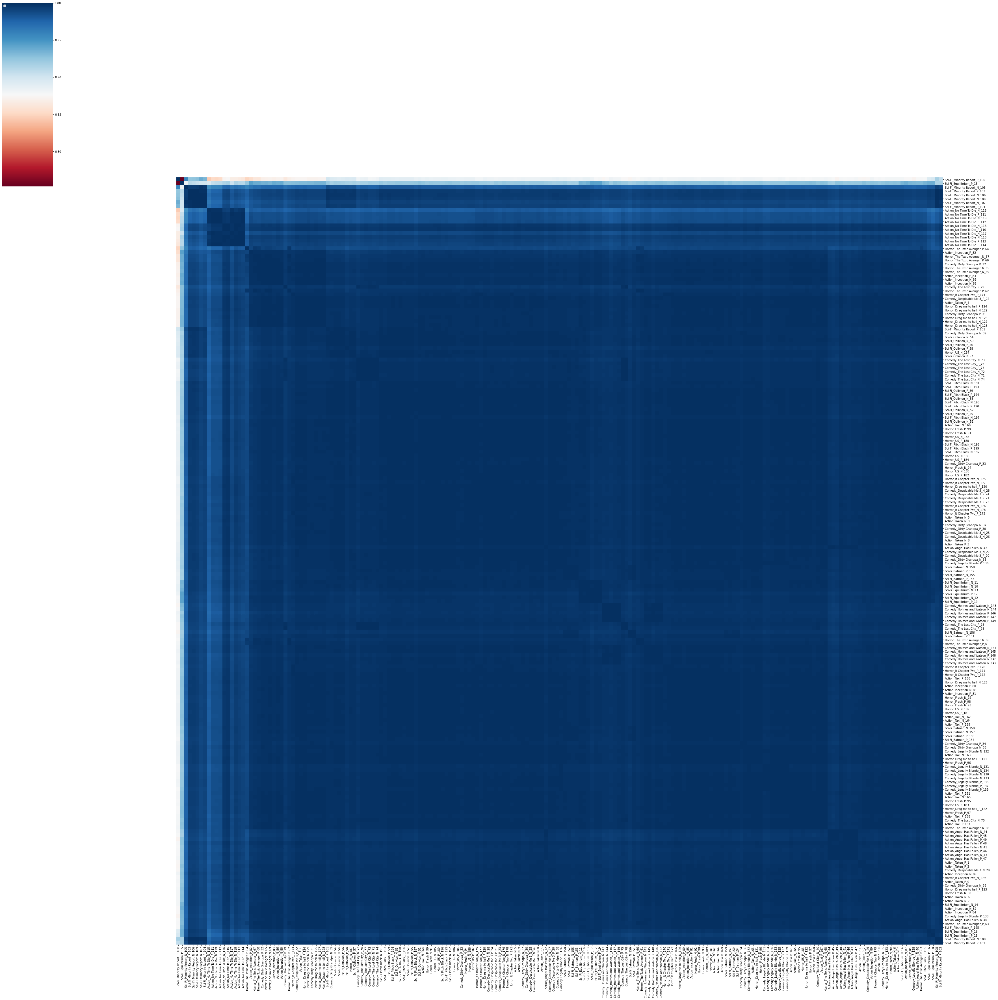

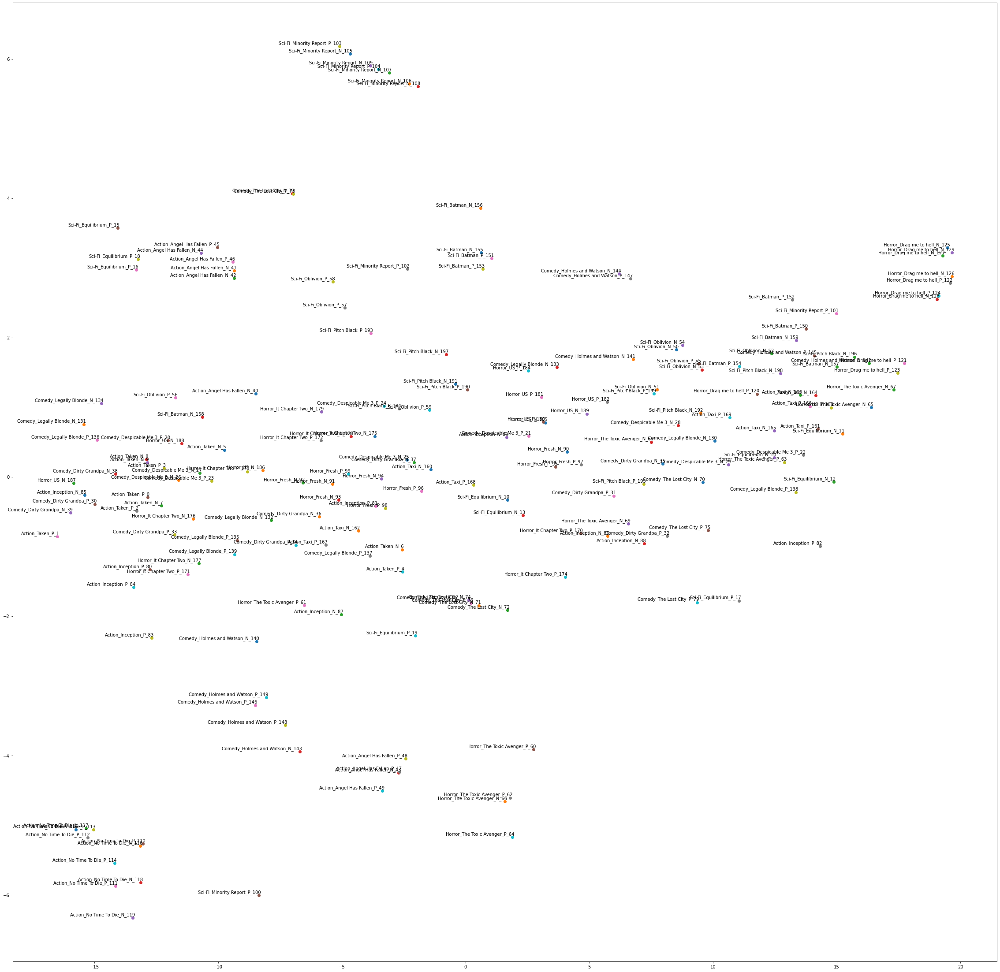

In [231]:
run_doc2vec_experiment(documents, clean_method_2, 300, 'Doc2Vec_exp')

### Using Data Wrangling Method 3

No handles with labels found to put in legend.


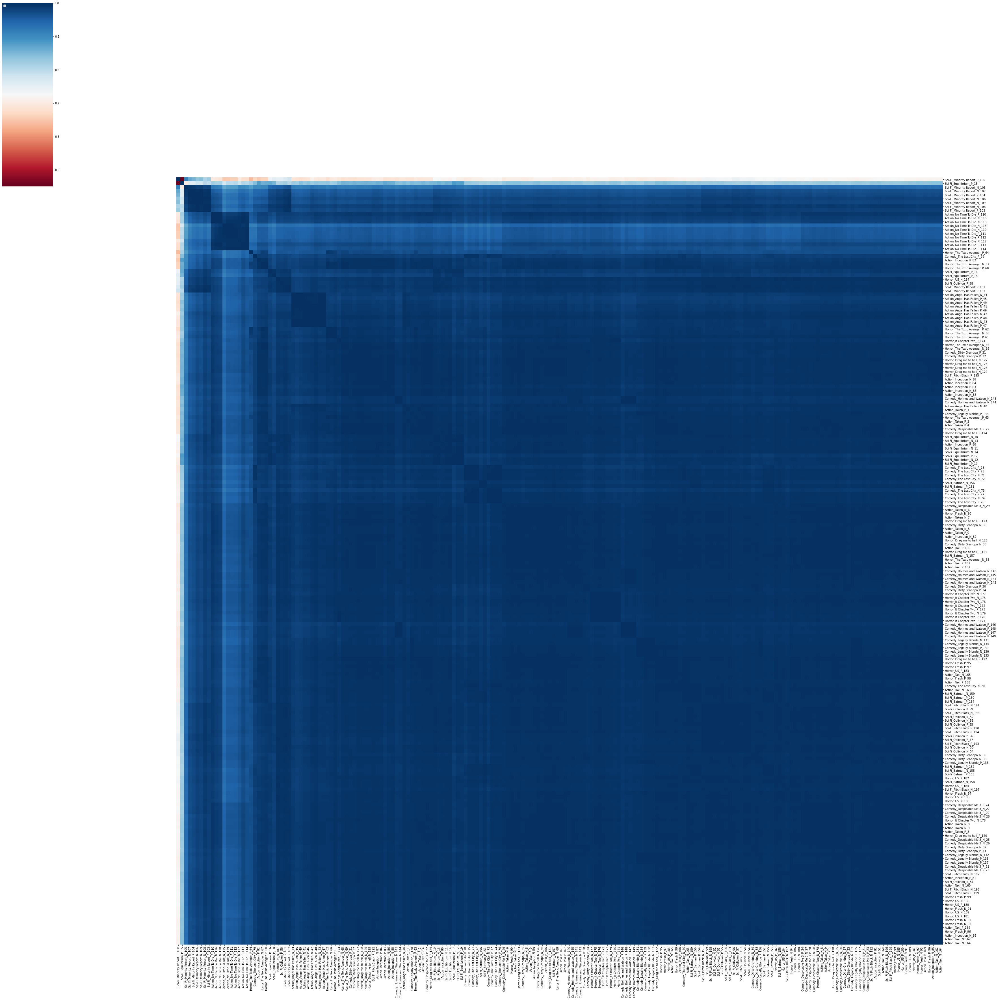

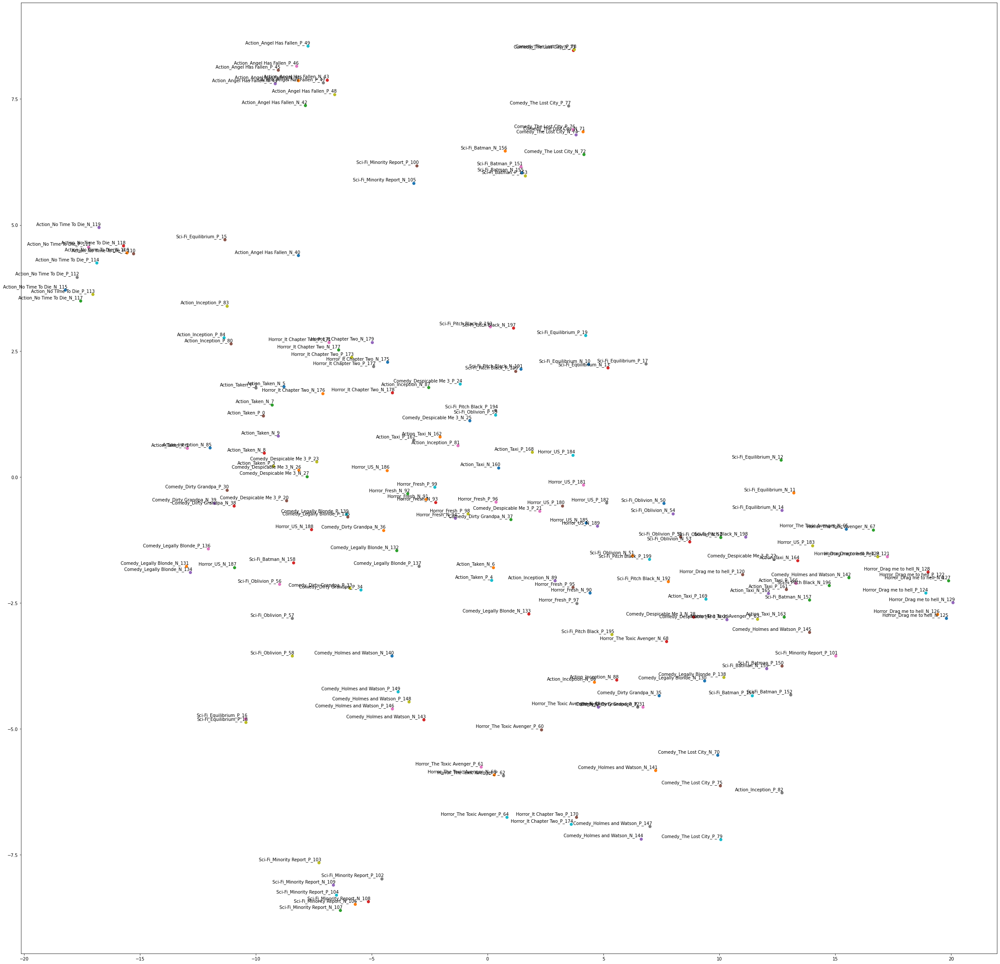

In [232]:
run_doc2vec_experiment(documents, clean_method_3, 100, 'Doc2Vec_exp')

No handles with labels found to put in legend.


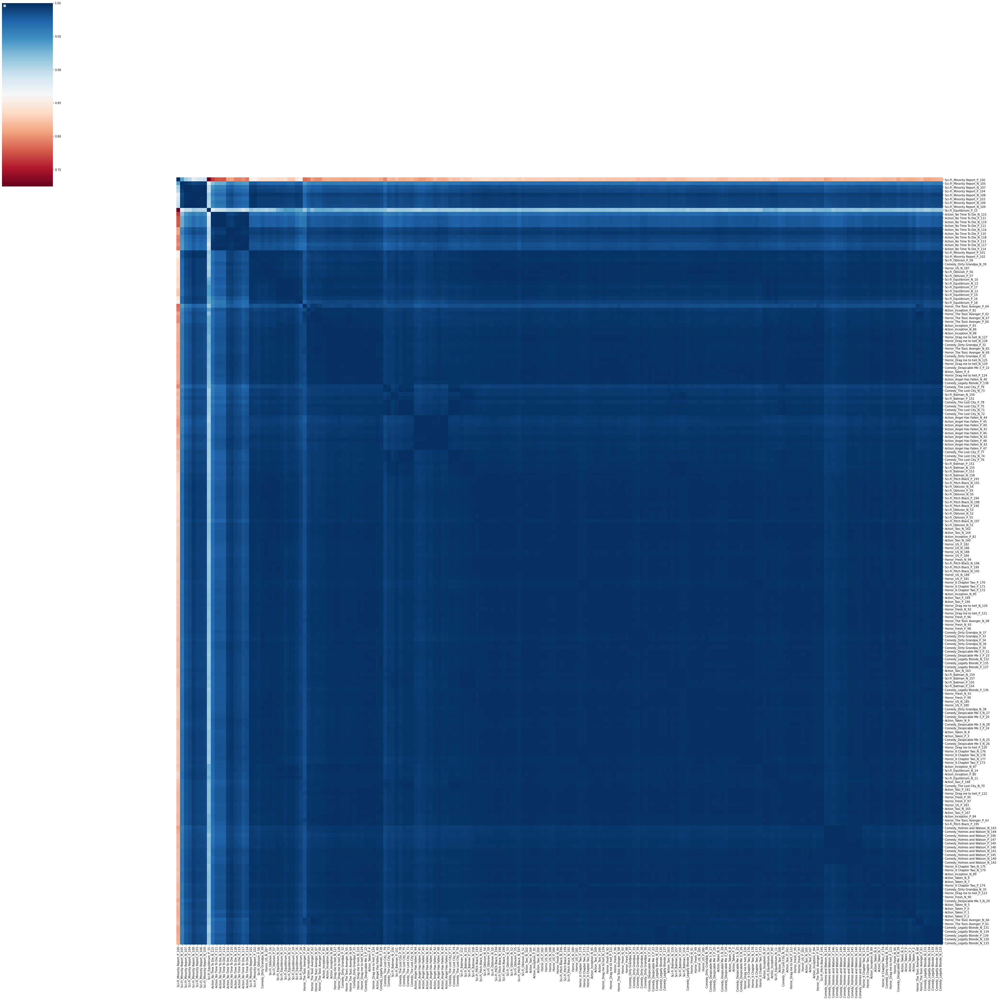

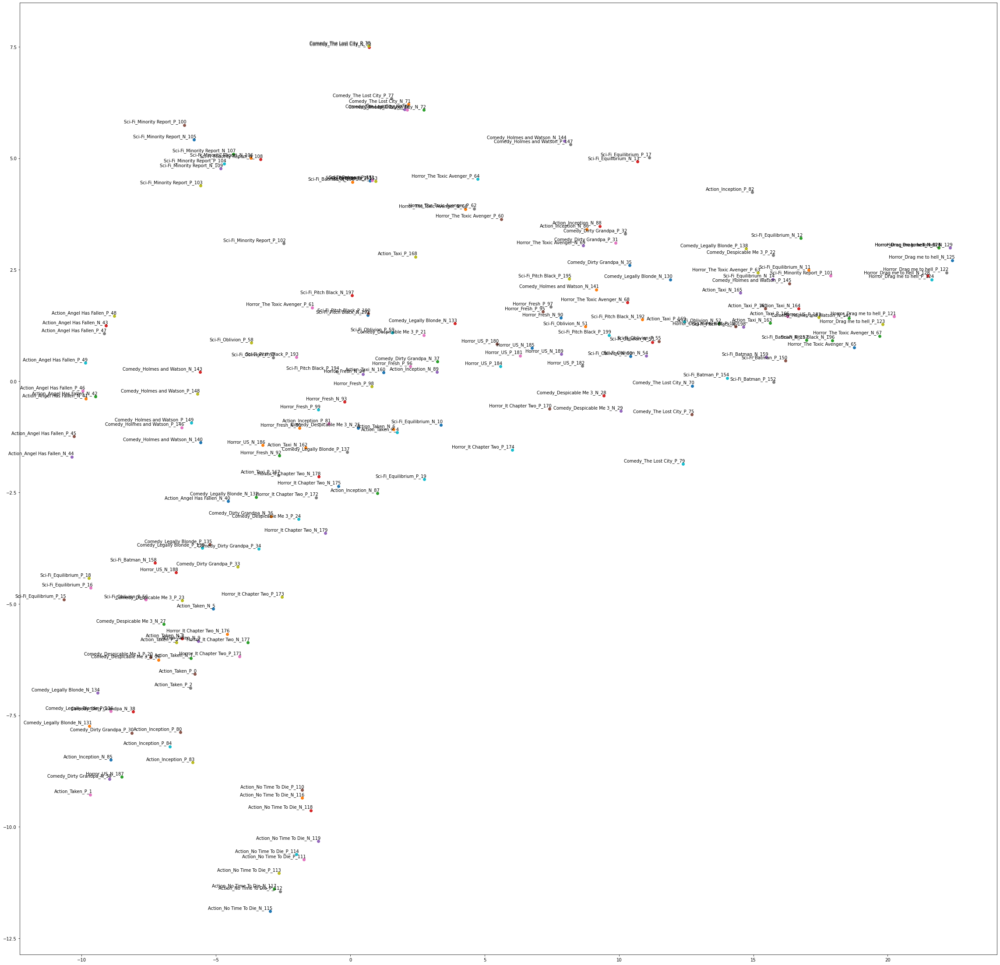

In [233]:
run_doc2vec_experiment(documents, clean_method_3, 200, 'Doc2Vec_exp')

No handles with labels found to put in legend.


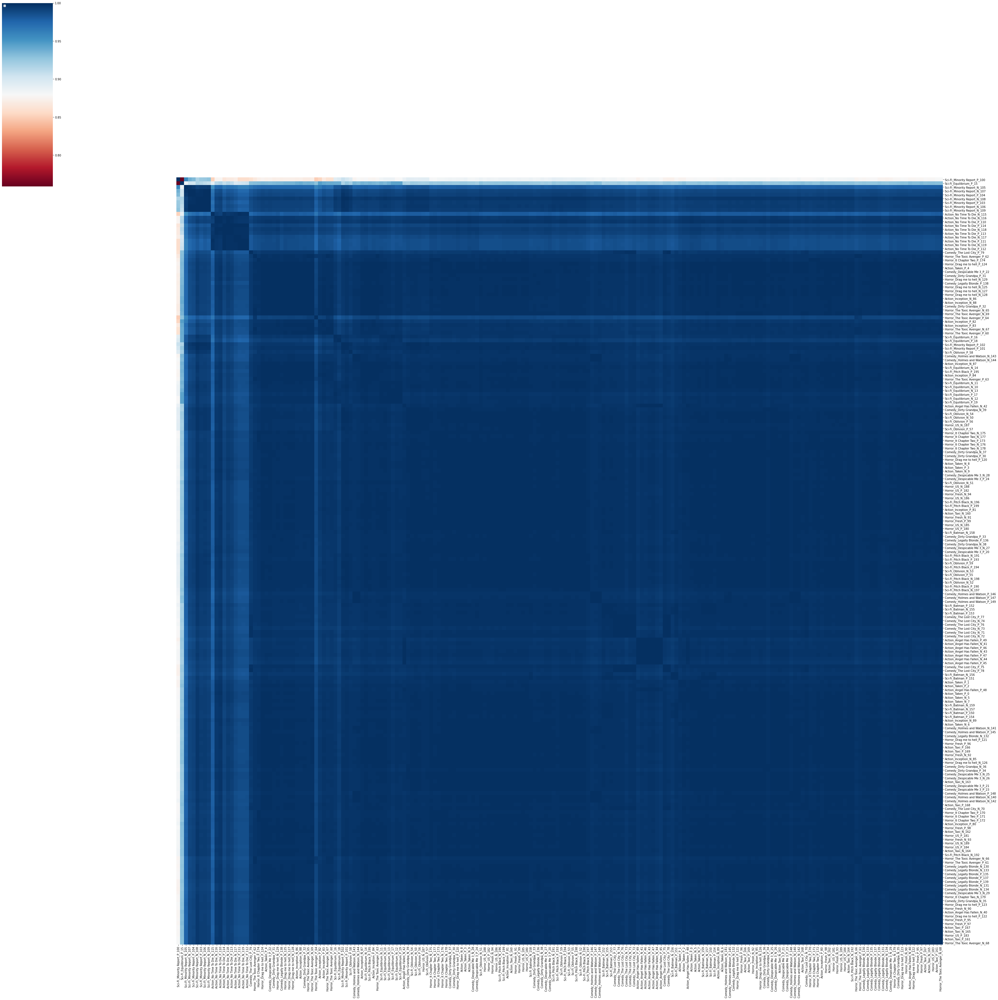

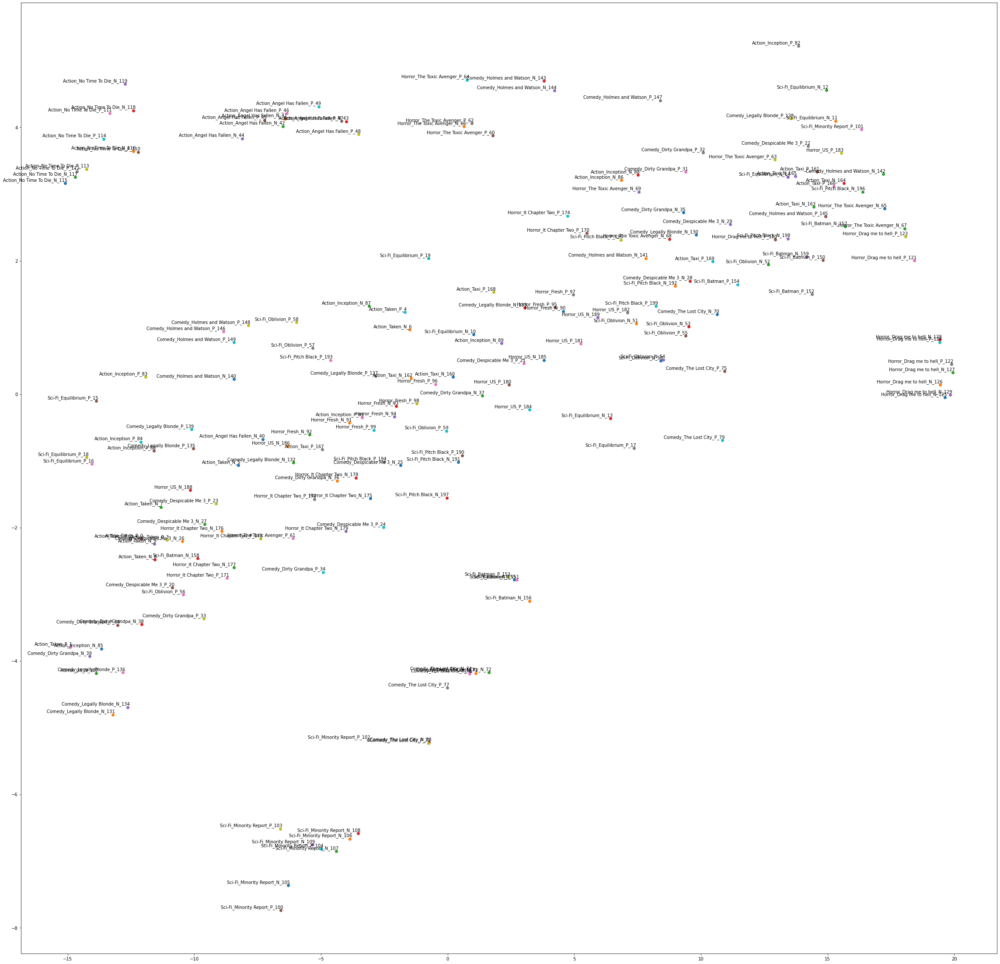

In [227]:
run_doc2vec_experiment(documents, clean_method_3, 300, 'Doc2Vec_exp')

### (iv). Token vectorization using Word2Vec embedding

In [373]:
def get_word2vec_vectors(documents: List[TokenizedDocument], embedding_size: int) -> pd.DataFrame:
    tokens = [x.tokens for x in documents]
    
    word2vec_model = gensim.models.Word2Vec(tokens, window=3, min_count=1, workers=12) ## updated
    #word2vec_model = Word2Vec(tokens, embedding_size, window=3, min_count=1, workers=12)
    
    vectors = {}
    for i in word2vec_model.wv.key_to_index: ## updated 
        temp_vec = word2vec_model.wv[i]
        #if temp_vec is not None: ## added
        vectors[i] = temp_vec
        #vectors[i] = 0 ## added

    result = pd.DataFrame(vectors).transpose()
    result = result.sort_index()
    return result

def run_word2vec_experiment(documents: List[Document],
                            clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                            embedding_size: int,
                            chosen_tokens: List[str],
                            experiment_name: str):
    cleaned_documents = clean_func(documents)

    word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)
    filtered_word2vec_df = word2vec_df.reindex(chosen_tokens).copy()
    
    ## add this step to drop the rows with nan values to avoid errors
    filtered_word2vec_df = filtered_word2vec_df.drop(filtered_word2vec_df[filtered_word2vec_df[0].isna() == True].index)
                                               
    plot_tsne(filtered_word2vec_df, 30, experiment_name)
    plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    plot_similarity_clustermap(filtered_word2vec_df, experiment_name)


In [356]:
extra_terms = [
    'sequences',
    'knight',
    'world',
    'shutter',
    'screen'
]

In [367]:
# Get our terms to examine in experiements 4-12

all_tokens = get_all_tokens(remove_stop_words(clean_method(documents)))
chosen_tokens = random.choices(all_tokens, k=100 - len(extra_terms)) + extra_terms

lemmatizer = WordNetLemmatizer()
lemmatized_chosen_tokens = [lemmatizer.lemmatize(x) for x in chosen_tokens]
#stemmed_chosen_tokens = [stemmer.stem(x) for x in lemmatized_chosen_tokens] ## use either lemmatizer or stemmer

### Using Data Wrangling Method 1

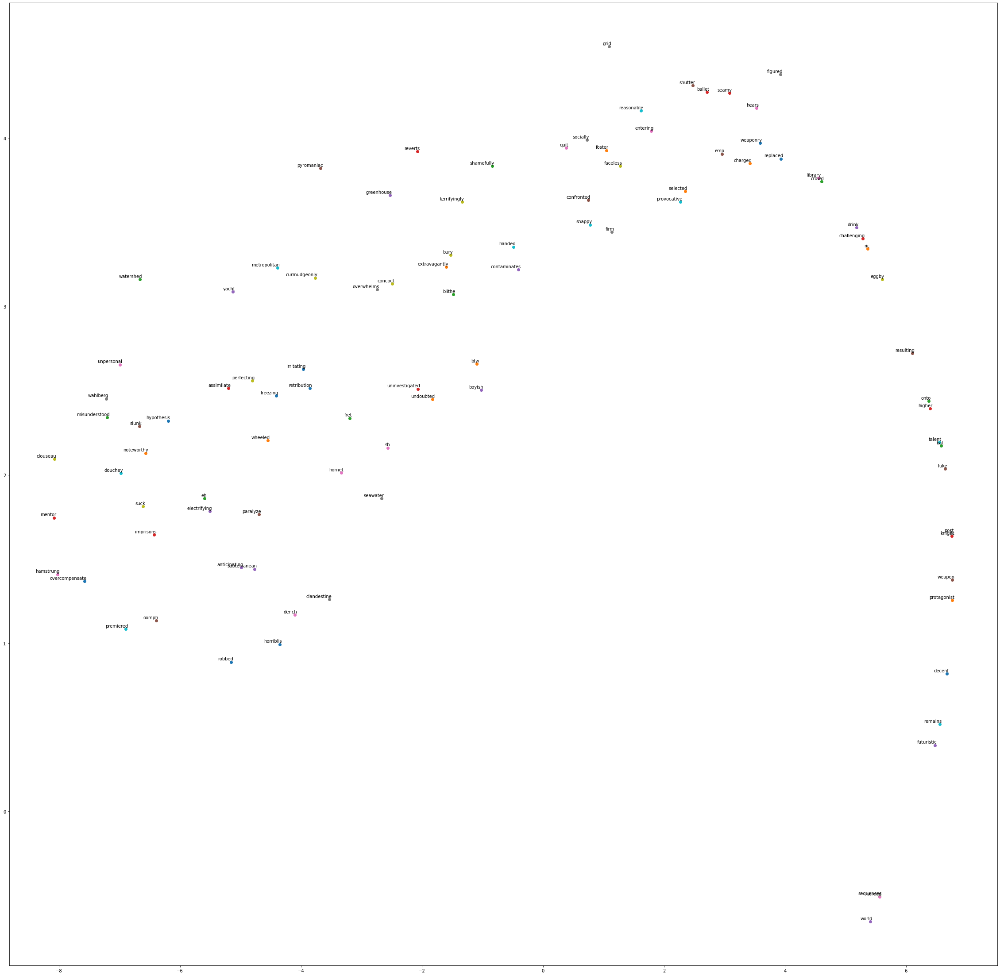

No handles with labels found to put in legend.


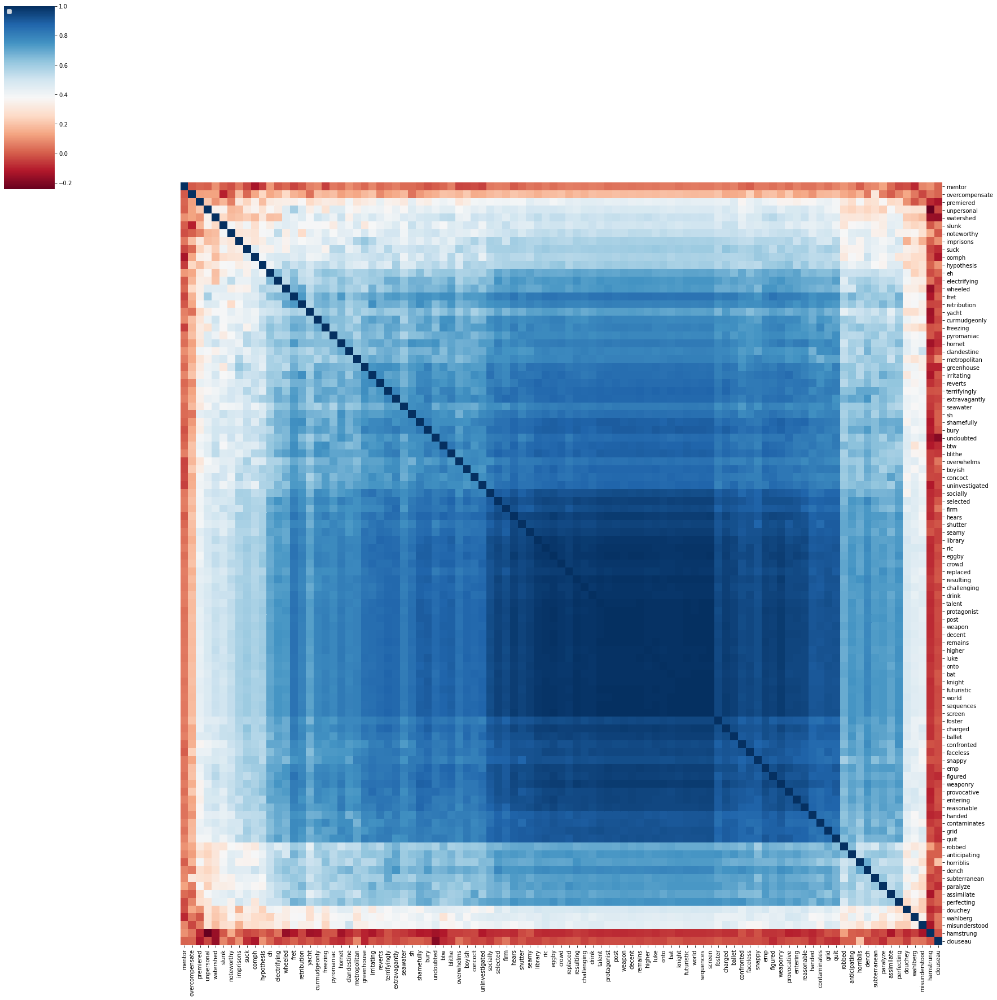

In [374]:
run_word2vec_experiment(documents, clean_method_1, 100, chosen_tokens, 'Word2Vec_M1_100')

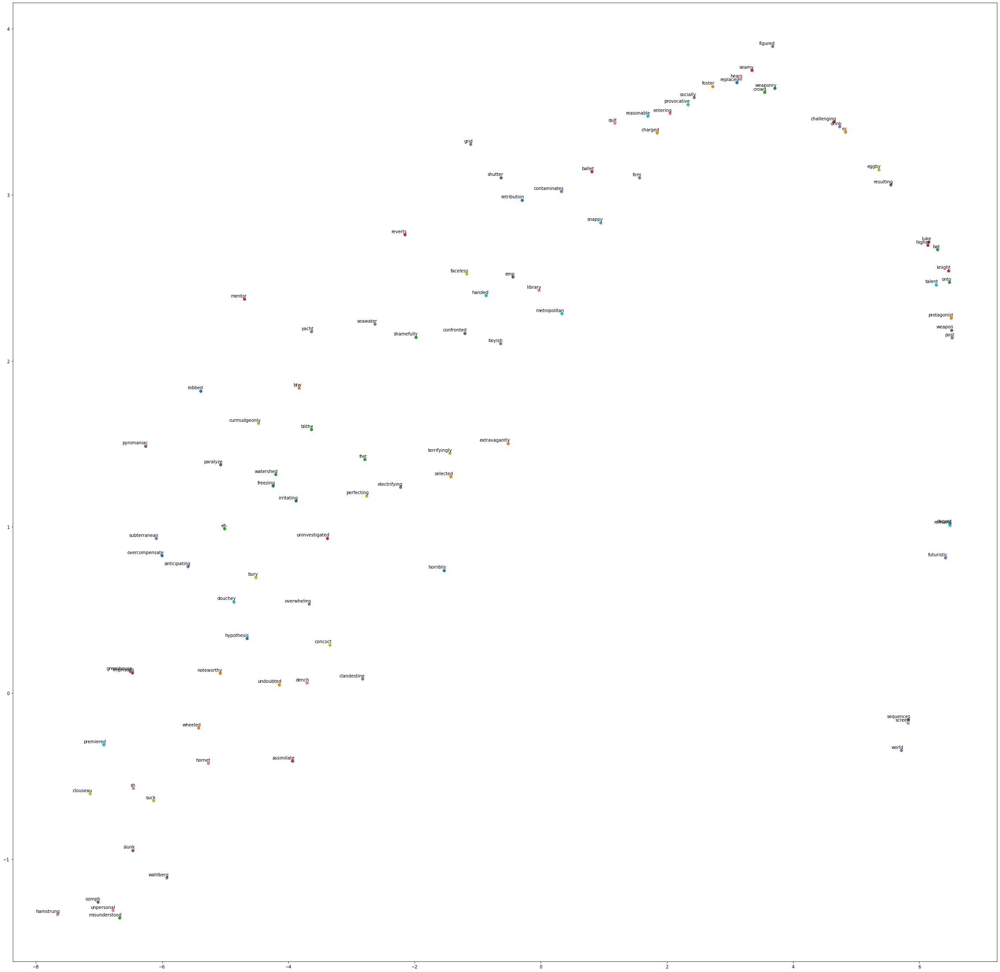

No handles with labels found to put in legend.


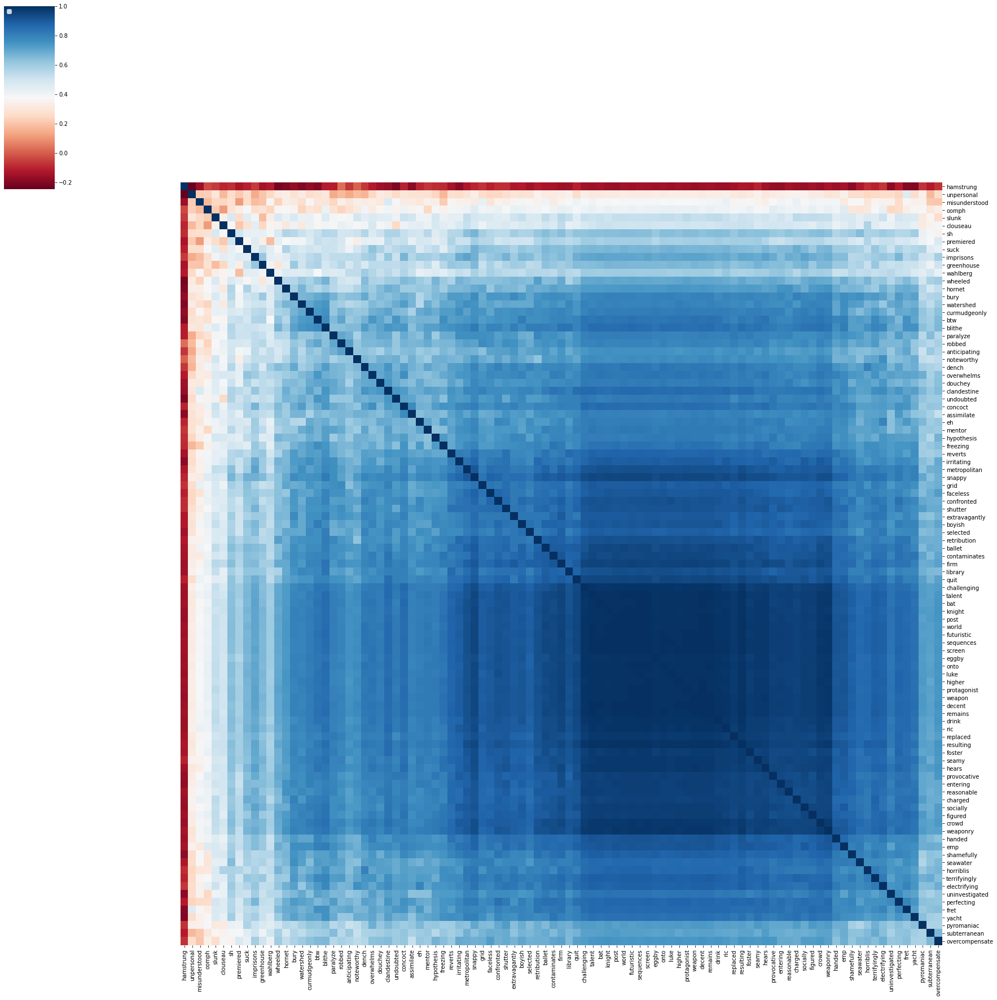

In [375]:
run_word2vec_experiment(documents, clean_method_1, 200, chosen_tokens, 'Word2Vec_M1_200')

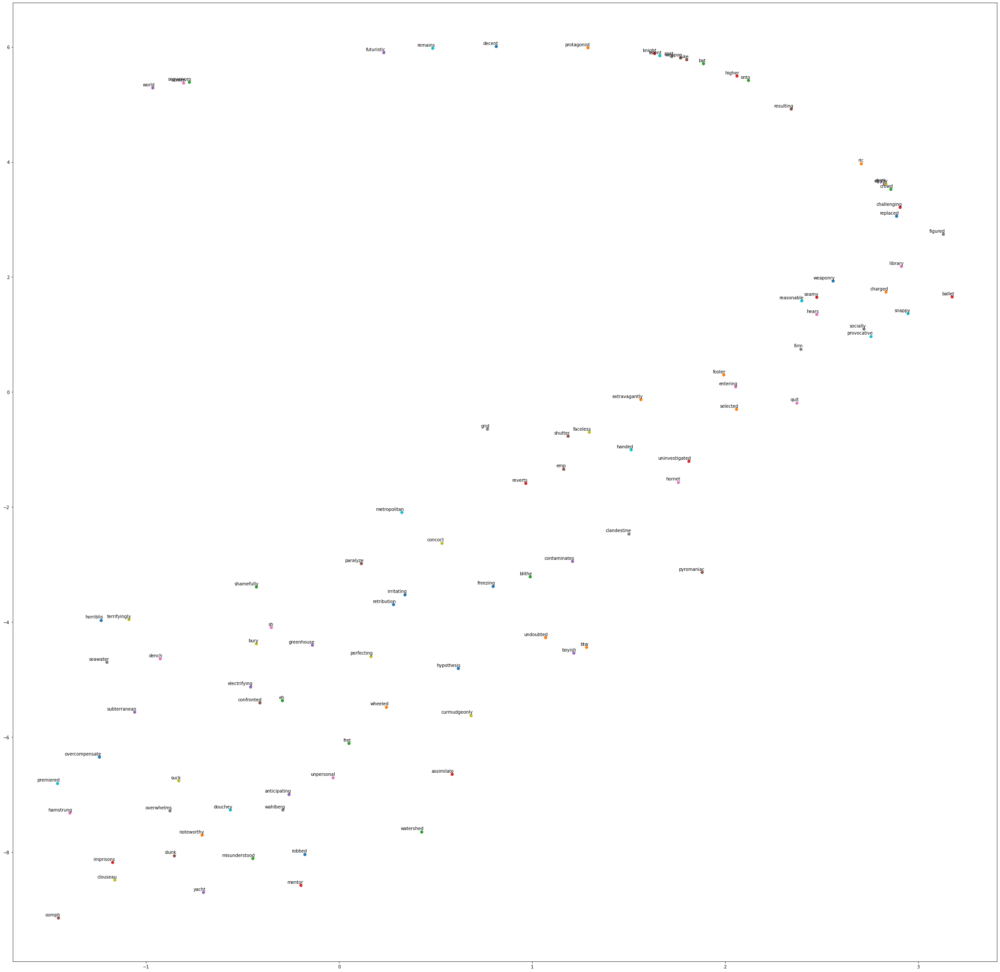

No handles with labels found to put in legend.


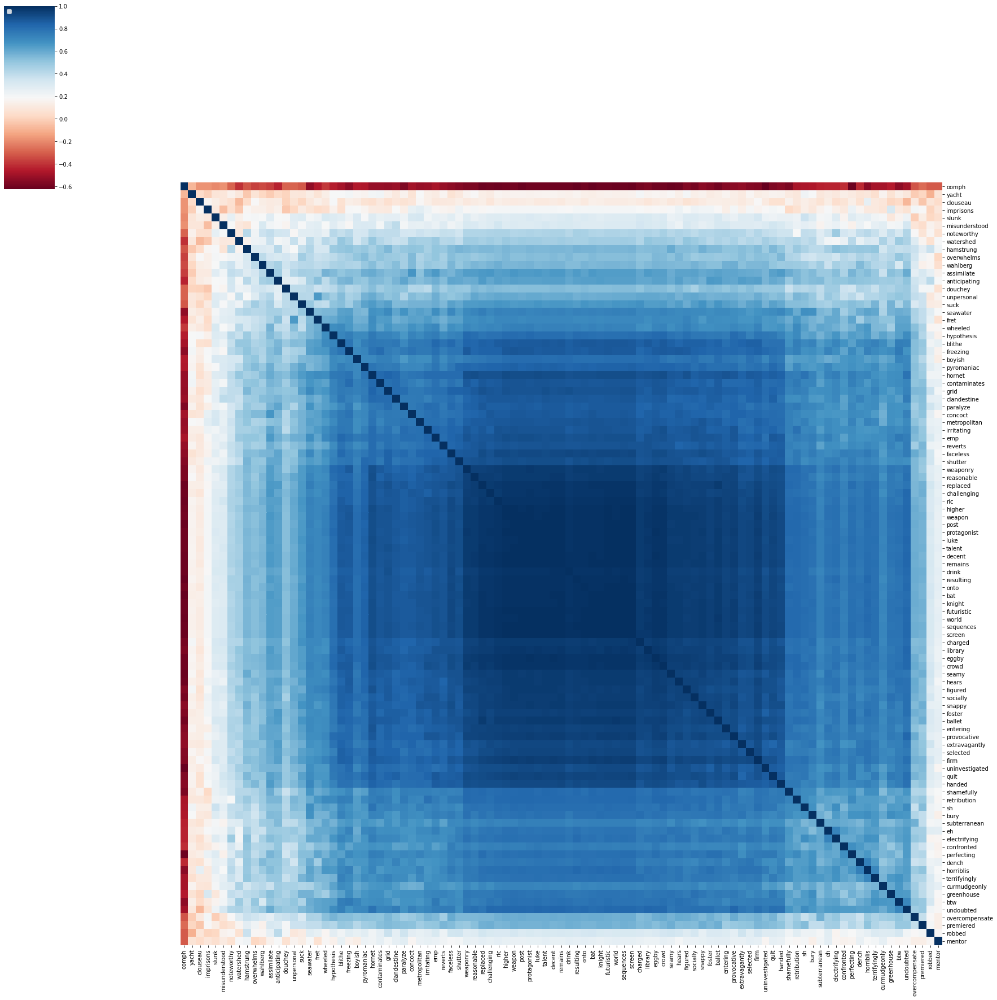

In [376]:
run_word2vec_experiment(documents, clean_method_1, 300, chosen_tokens, 'Word2Vec_M1_300')

### Using Data Wrangling Method 2

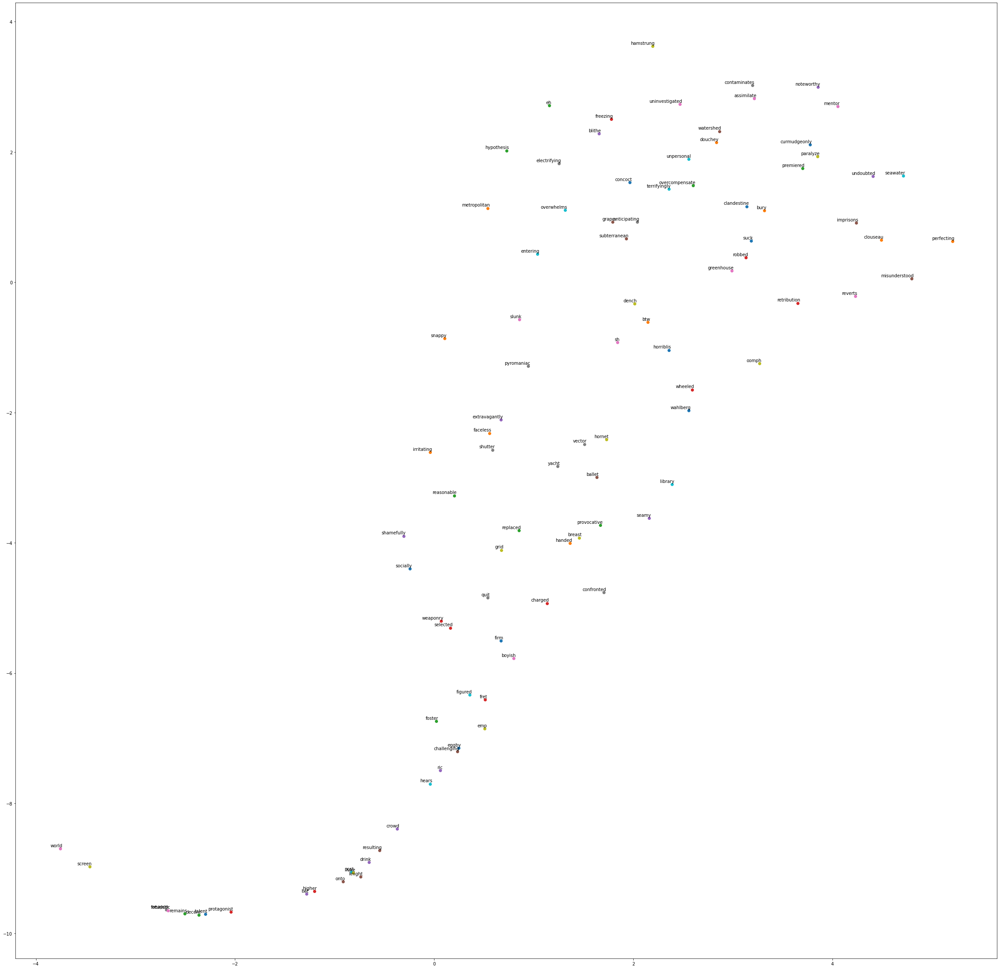

No handles with labels found to put in legend.


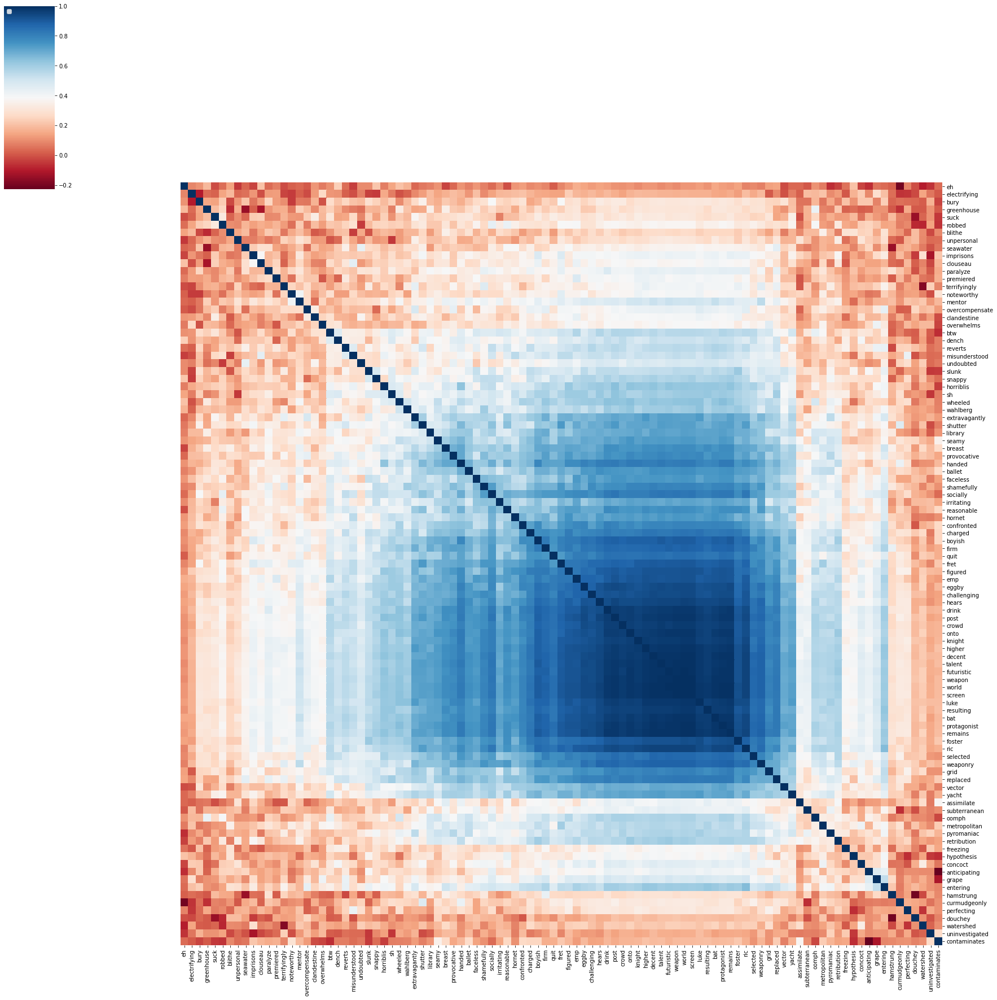

In [378]:
run_word2vec_experiment(documents, clean_method_2, 100, chosen_tokens, 'Word2Vec_M2_100')

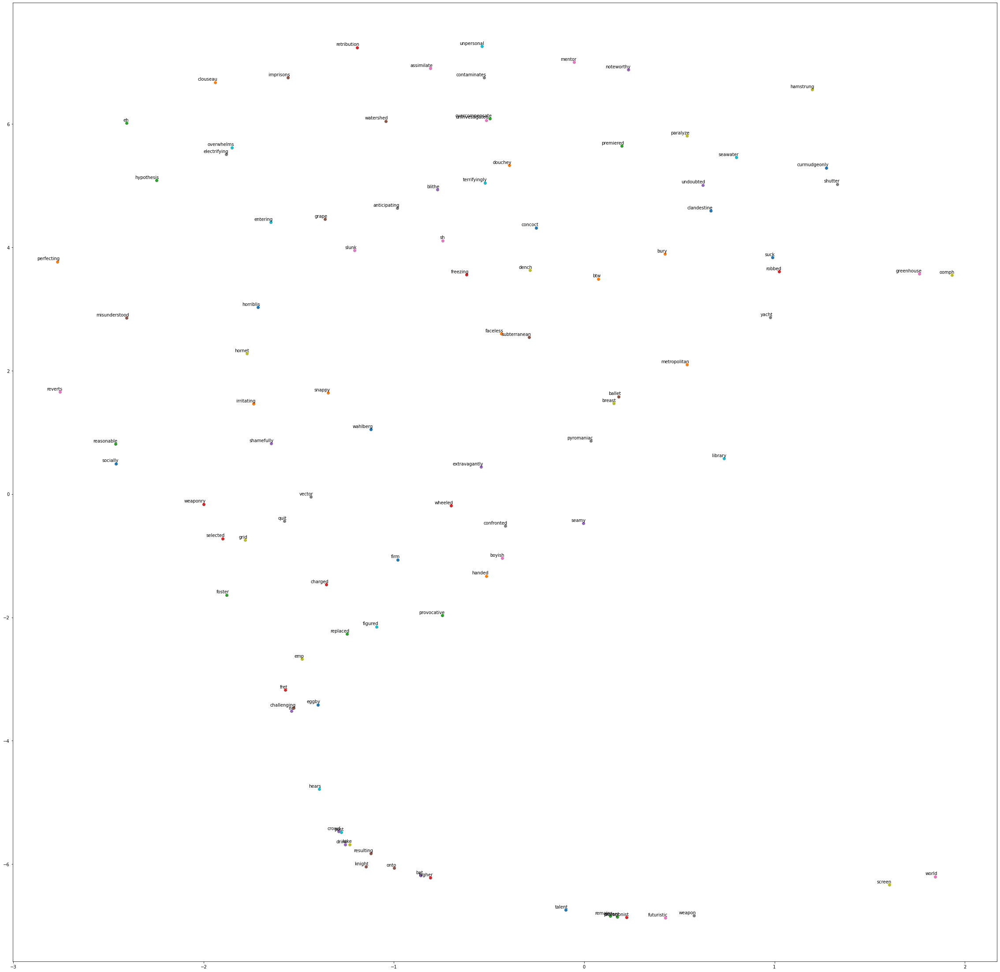

No handles with labels found to put in legend.


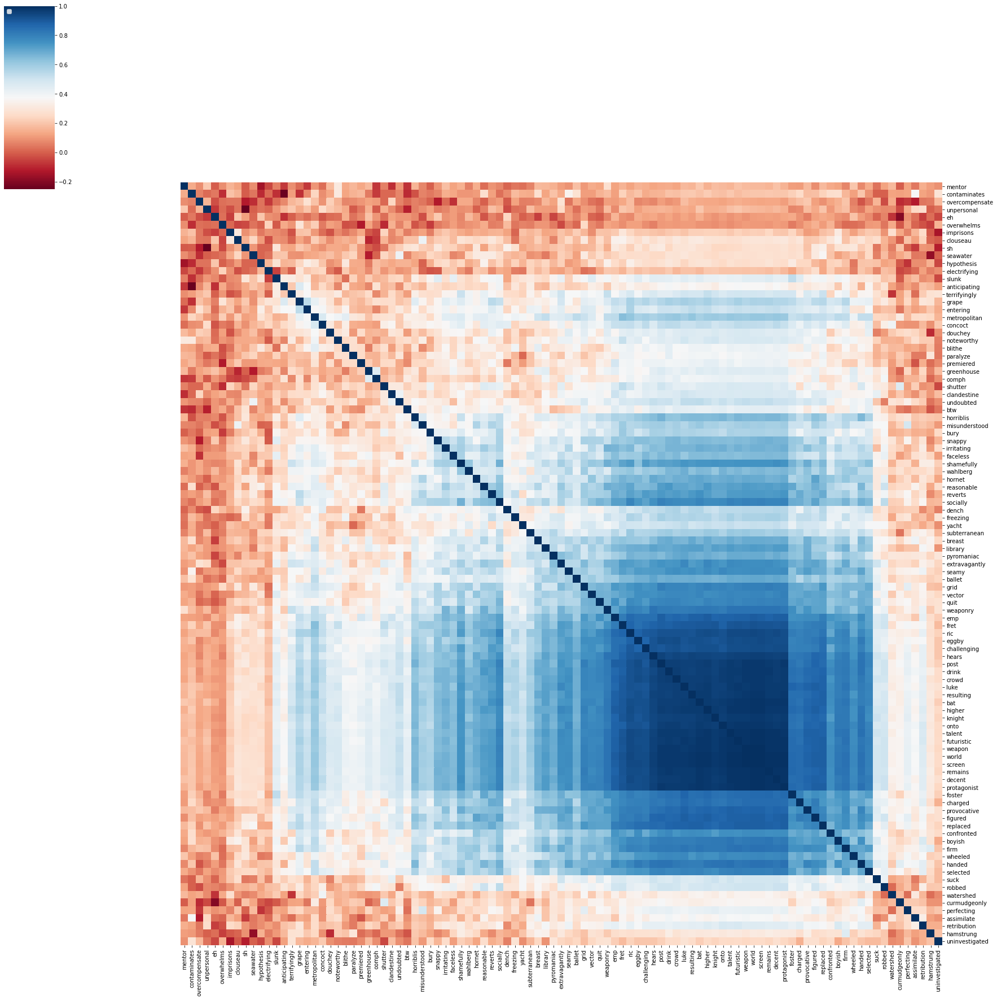

In [379]:
run_word2vec_experiment(documents, clean_method_2, 200, chosen_tokens, 'Word2Vec_M2_200')

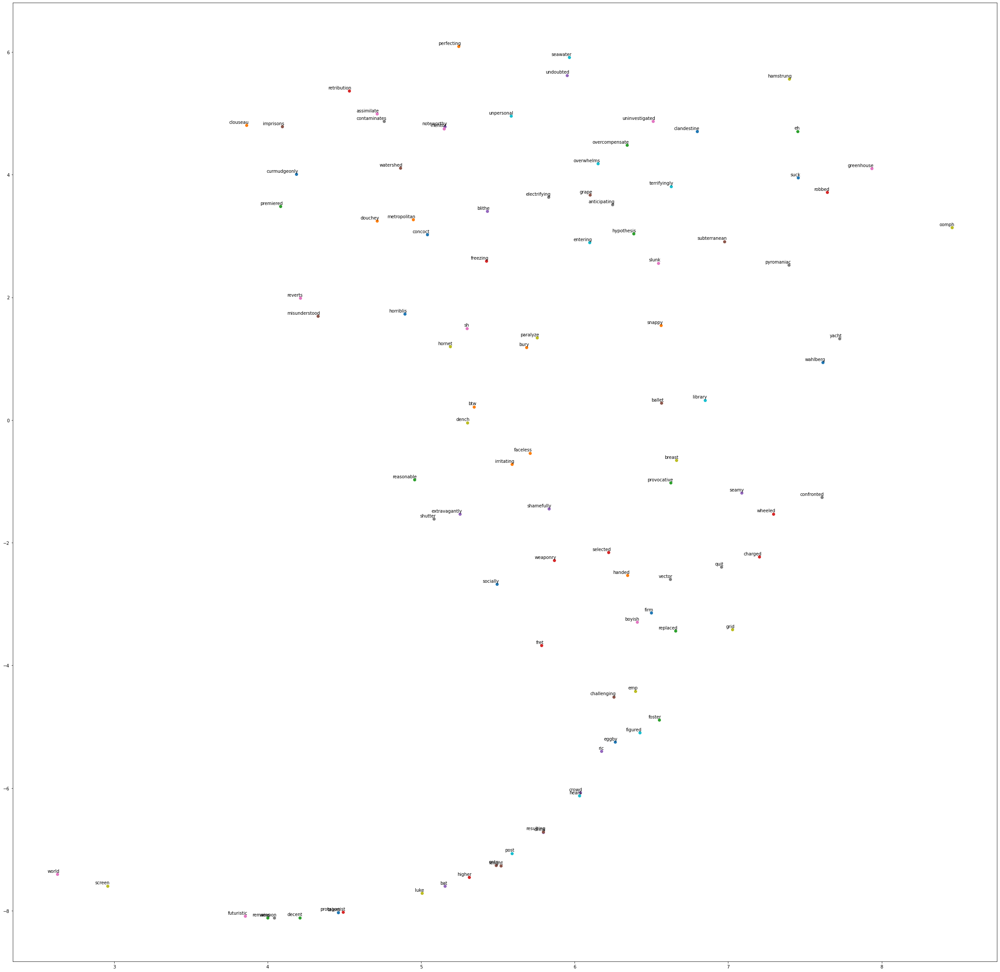

No handles with labels found to put in legend.


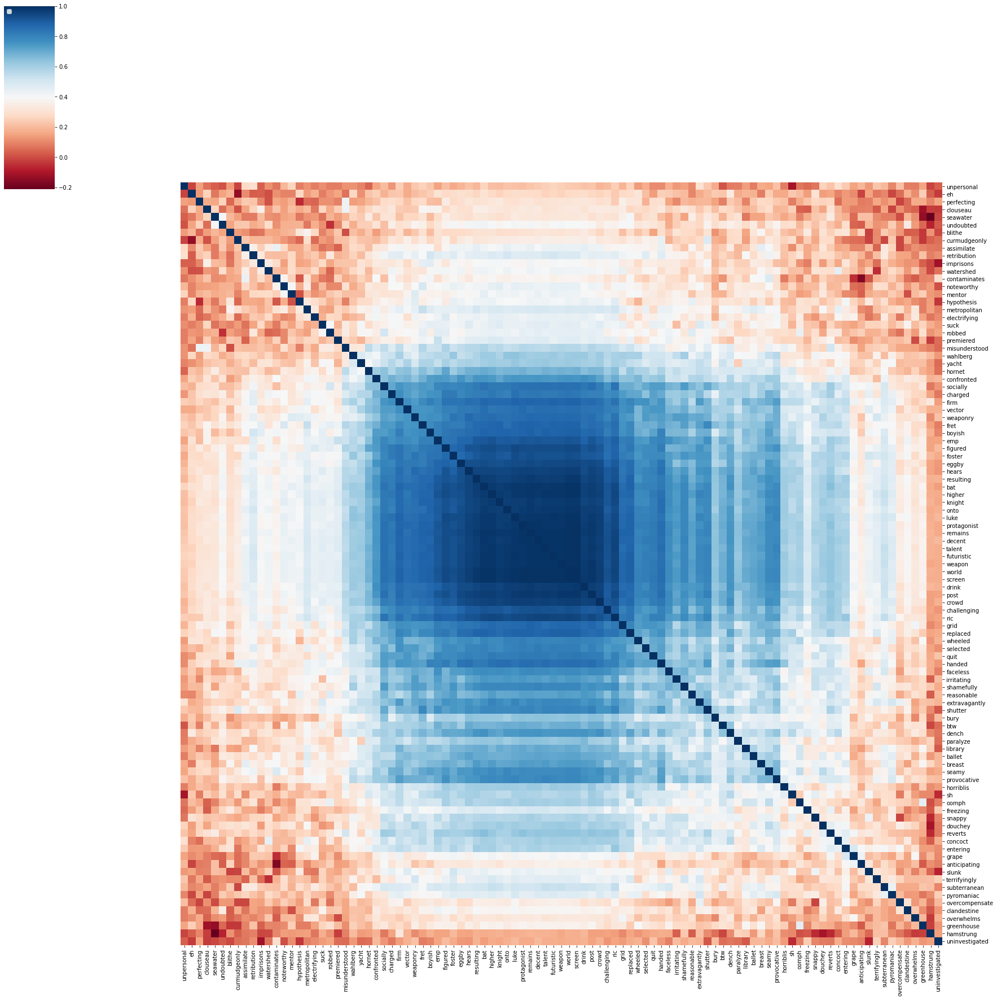

In [380]:
run_word2vec_experiment(documents, clean_method_2, 300, chosen_tokens, 'Word2Vec_M2_300')

### Using Data Wrangling Method 3

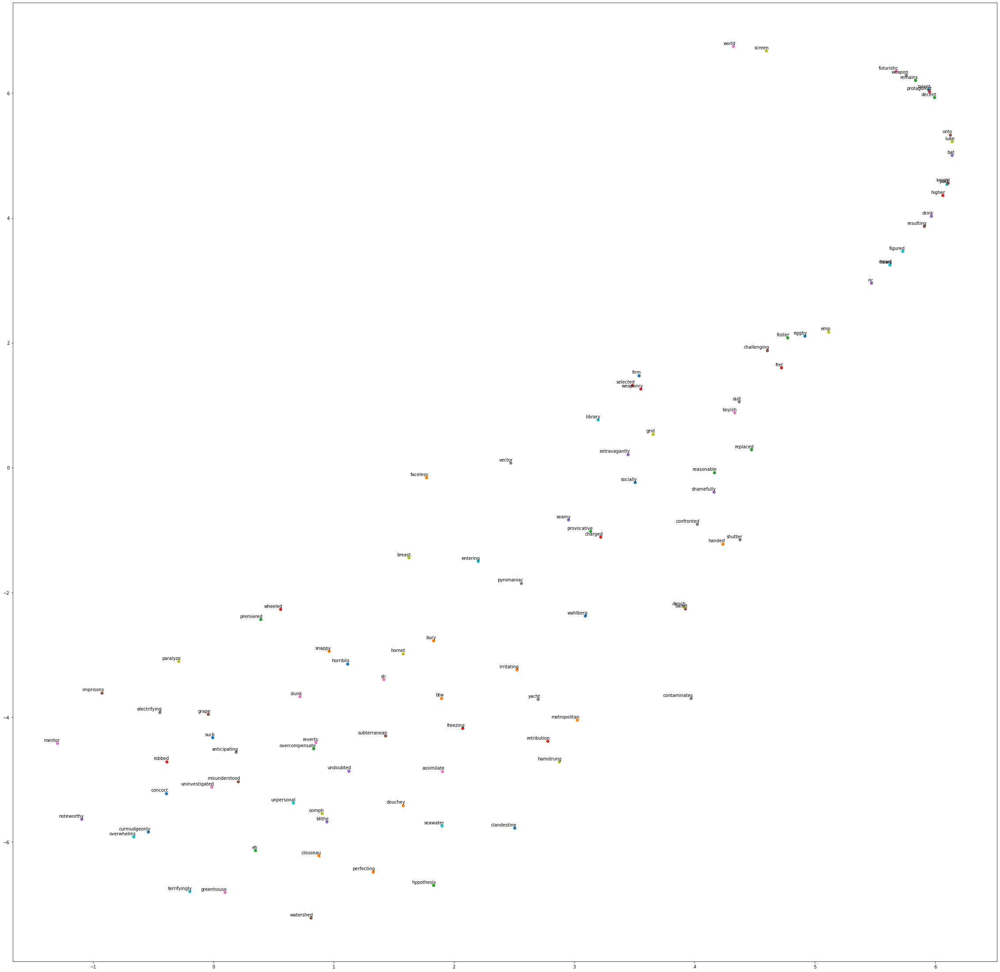

No handles with labels found to put in legend.


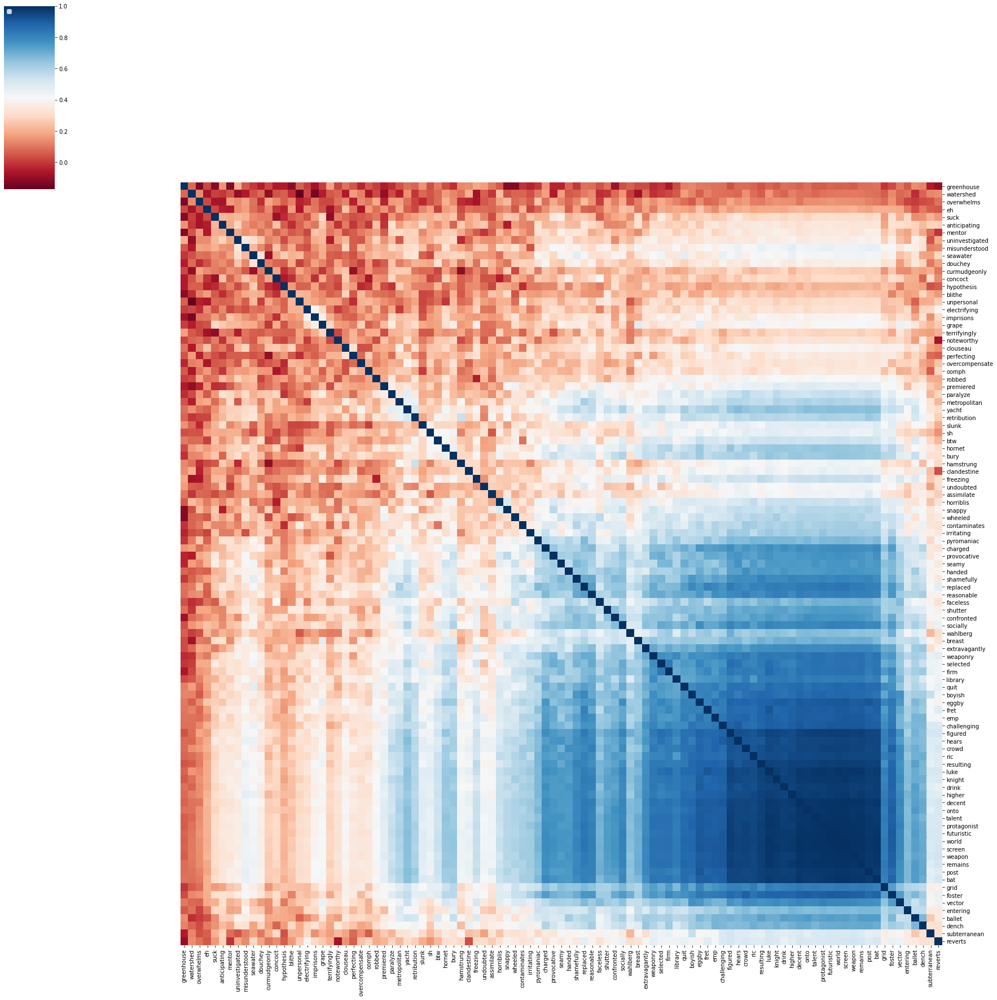

In [381]:
run_word2vec_experiment(documents, clean_method_3, 100, chosen_tokens, 'Word2Vec_M3_100')

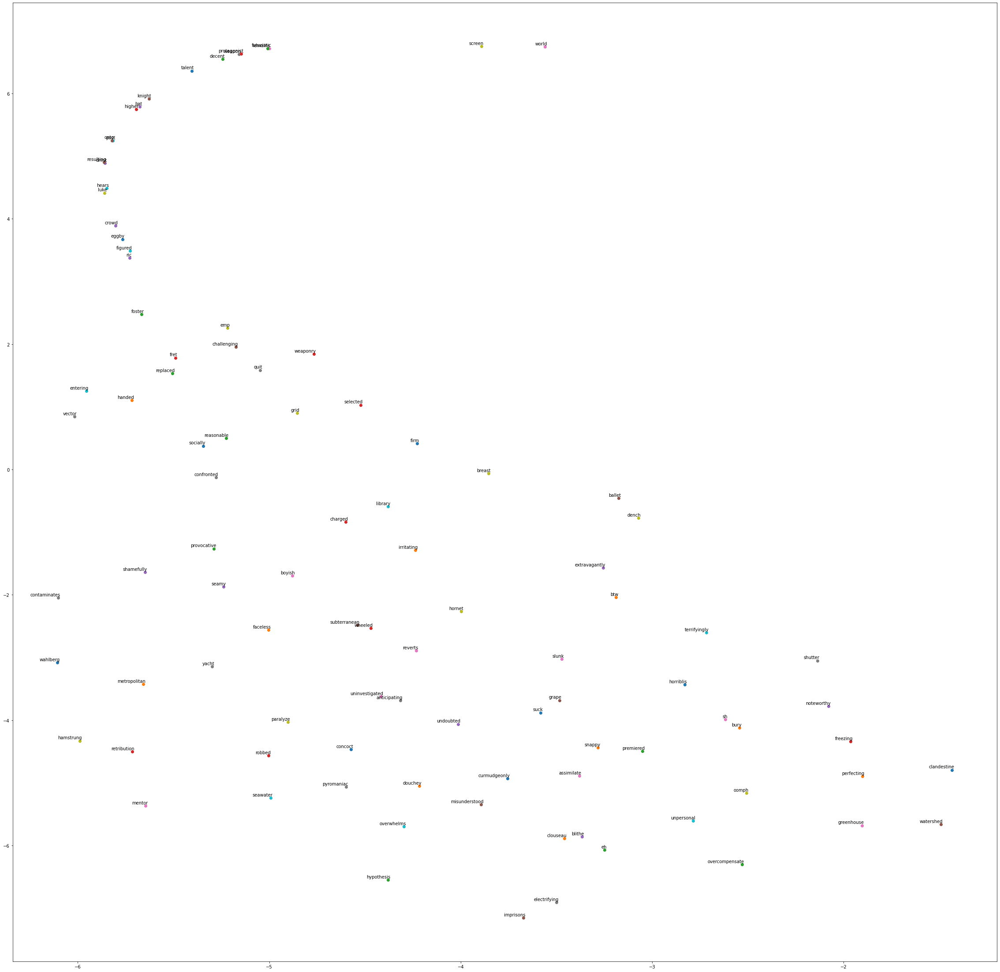

No handles with labels found to put in legend.


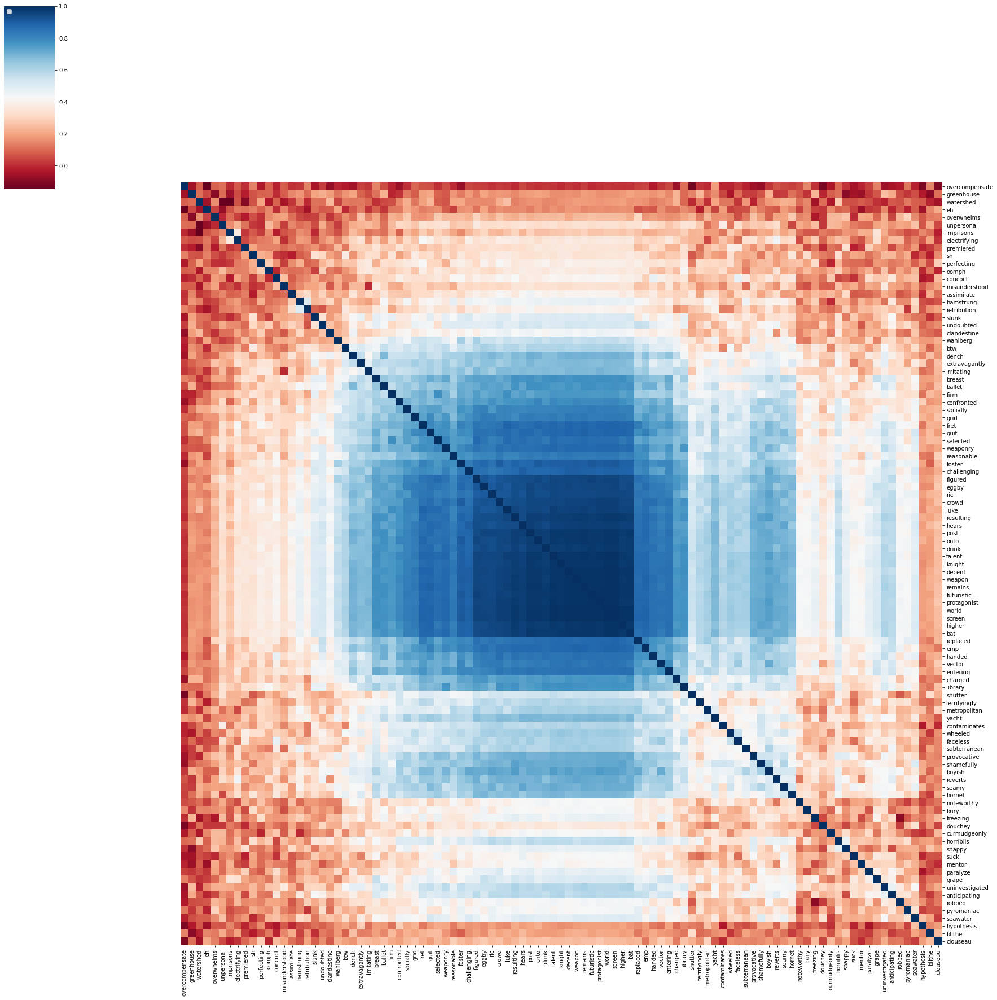

In [382]:
run_word2vec_experiment(documents, clean_method_3, 200, chosen_tokens, 'Word2Vec_M3_200')

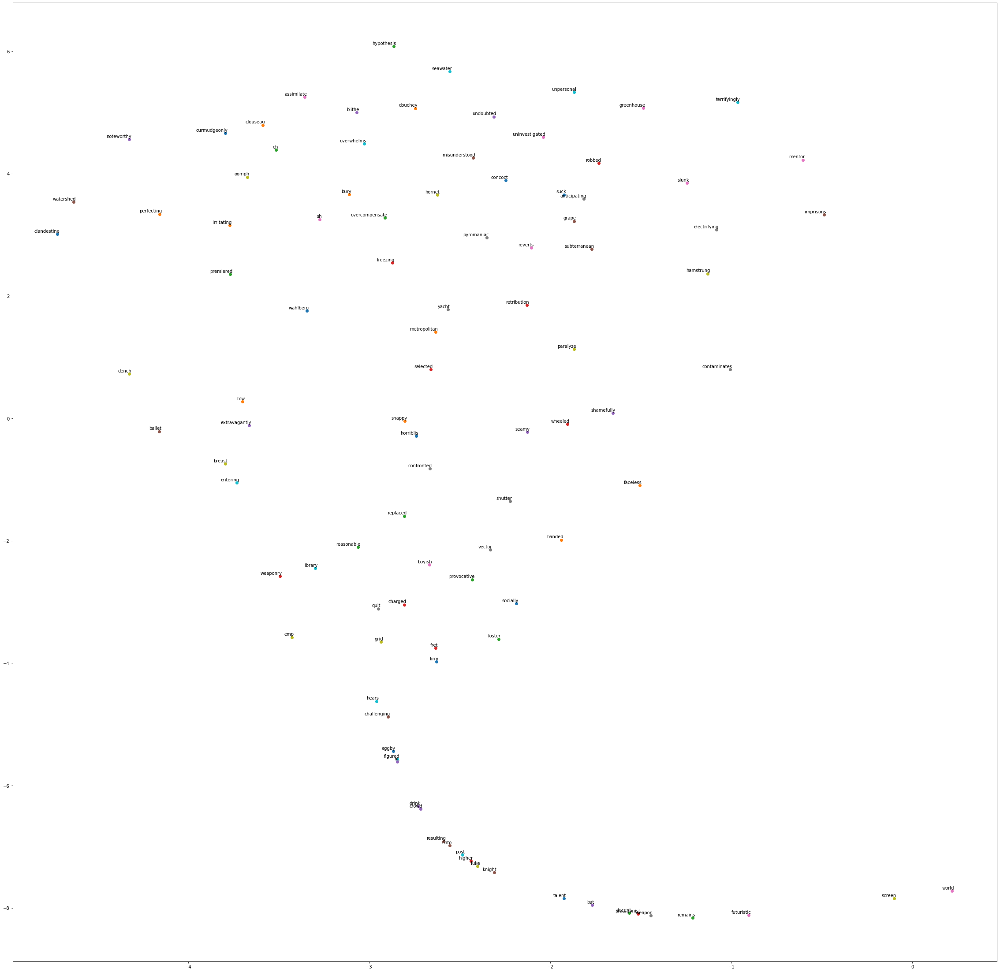

No handles with labels found to put in legend.


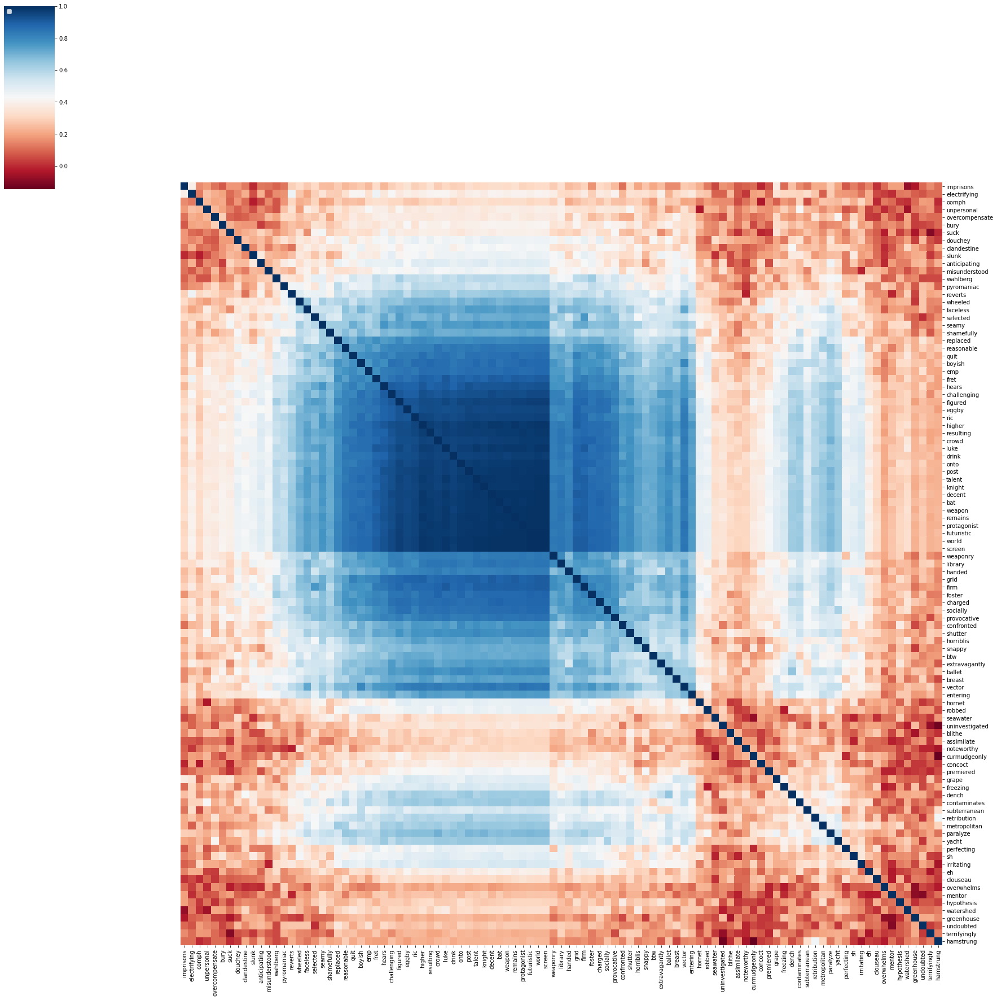

In [383]:
run_word2vec_experiment(documents, clean_method_3, 300, chosen_tokens, 'Word2Vec_M3_300')